# Complete analysis and treatment of Vertical MD4224 scan

In [1]:
import sys
import gzip
import glob
import pickle
import pandas as pd
import numpy as np
import scipy.io as sio 

sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')

from myToolbox import *
from math import log10, floor
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-1062.1.2.el7.x86_64-x86_64-with-centos-7.6.1810-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/From_Scratch/V_Mini_Optimised
Your IP is 172.17.0.10
2019-10-29 12:13:19


In [32]:
%run ../MD_Functions.ipynb


	Importing MD Analysis functions for MD4224


### Import MD files

In [3]:
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
len(myFiles)

450

### Convert matlab files to dataframe

In [4]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [5]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [6]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2391116740353679, 0.23971673231960905, 0.23...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20977273575518698, 0.20940702780573384, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23976878434647172, 0.24005858967109586, 0.2...",1.536136e+09,1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.20904288280545877, 0.2091414764329, 0.20907..."
2018-09-05 10:20:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.23979297109117814, 0.23927600776361443, 0.2...",1.536136e+09,1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.20910096986069623, 0.20919447601635738, 0.2..."
2018-09-05 10:21:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.22984427276260058, 0.23000876451501565, 0.2...",1.536136e+09,1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.20900025780414888, 0.20880781328871953, 0.2..."
2018-09-05 10:21:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.21960233799140136, 0.21974349999447174, 0.2...",1.536136e+09,1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.20920446730191952, 0.20915974993014785, 0.2..."
2018-09-05 10:22:18.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.2102815567691356, 0.20942227306900782, 0.20...",1.536136e+09,1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.20715974144784158, 0.20999031660603723, 0.2..."
2018-09-05 10:22:54.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.19871366825637893, 0.1989663926550141, 0.20...",1.536136e+09,1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.2100921495539858, 0.20985952297053748, 0.20..."
2018-09-05 10:23:30.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.1899620637501338, 0.1906069731650187, 0.189...",1.536136e+09,1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.20933471986513602, 0.20873250795510992, 0.2..."
2018-09-05 10:24:06.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.18002022523528952, 0.1798854030479251, 0.18...",1.536136e+09,1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.20916809409599718, 0.2091351622165313, 0.20..."
2018-09-05 10:24:42.700,1.536143e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.05_vertica...,"[0.171126744770092, 0.17001407402332383, 0.171...",1.536136e+09,1.536136e+09,"[-0.12714, -0.11564, -0.10716, -0.089000000000...","[0.20855192735048142, 0.20957426025888468, 0.2..."


In [7]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.23347503095737e-11  Min: 0.0  Max: 1.0050637639308164e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.68740573399049e-06  Min: 4.687012369152908e-06  Max: 4.735469788809376e-06


In [8]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [9]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [10]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [11]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [12]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [13]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.16468000000000002, -0.15378, -0.1374300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:19:54.700,0.208865,0.239484
1.536136e+09,"[-0.21493, -0.20040000000000002, -0.18587, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:20:30.700,0.208899,0.239078
1.536136e+09,"[-0.19495, -0.18526, -0.17436000000000001, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:06.700,0.208694,0.229331
1.536136e+09,"[-0.14228000000000002, -0.13138000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:21:42.700,0.208412,0.219715
1.536136e+09,"[-0.13864, -0.12593000000000001, -0.1150300000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:18.700,0.208581,0.209510
1.536136e+09,"[-0.19676000000000002, -0.18345, -0.17013, -0....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:22:54.700,0.208356,0.199719
1.536136e+09,"[-0.21372000000000002, -0.20040000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:23:30.700,0.208183,0.189839
1.536136e+09,"[-0.16226000000000002, -0.15499000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,2018-09-05 10:24:06.700,0.208225,0.179881


In [14]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Intensity, Losses, Ratio

In [15]:
df_second=intensity_df(df_first,start=70,end=1185)

In [16]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:19:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208865,0.239484,7.023244e+11,2.106413,0.978936
2018-09-05 10:20:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536136e+09,0.208225,0.179881,7.214954e+11,0.909661,0.990903


### Check for duplicates

In [17]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


### Plot Intensity, Losses, Ratio

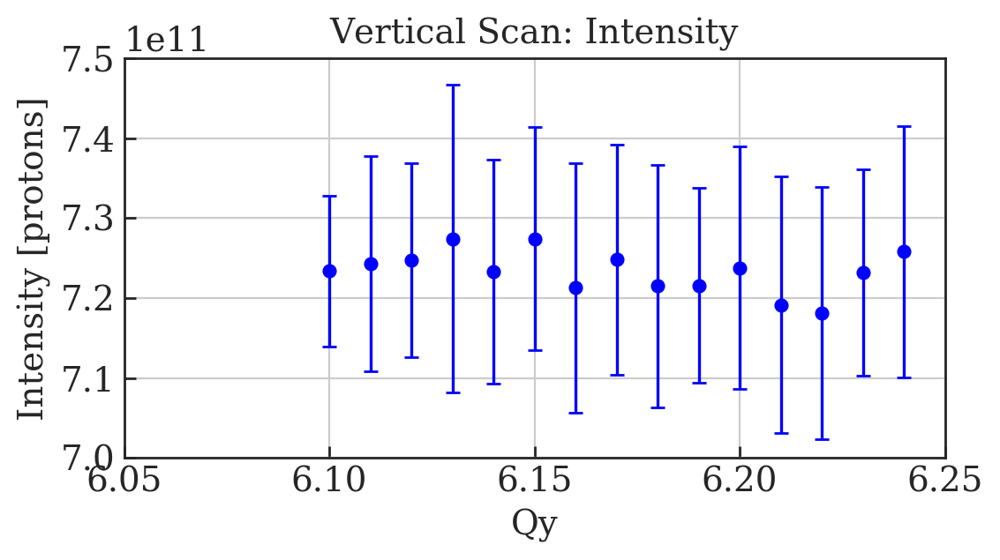

In [18]:
# Plot averaged data points with error bars
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qy']>lower_lim)][(df_second['Qy']<upper_lim)] ) )
    
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)
#plt.plot(x_d, y_d, 'r-', label='7.25E11')

plt.xlabel('Qy');
plt.ylabel('Intensity [protons]');
plt.title('Vertical Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Vertical_Intensities_Errors.png');

# Timber: Vertical

In [19]:
dfV=read_data(year=2018,date=5,month=9,hour=10,minutes=0,span=5,user='CPS%MD1',WS='64.V');

In [20]:
len(dfV)

432

In [21]:
dfV

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14046, -0.13017, -0.11988, -0.1005, -0.082...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+18
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20706, -0.18889, -0.17557, -0.15317, -0.12...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+18
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.21311, -0.20282, -0.18889, -0.1671, -0.150...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+18
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.13985, -0.12956, -0.13198, -0.11685, -0.10...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+18
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.14591, -0.12472, -0.11624, -0.10111, -0.08...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+18
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.20464, -0.18526, -0.16831, -0.14349, -0.12...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+18
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.22098, -0.21008, -0.20161, -0.18223, -0.15...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+18
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.1562, -0.15136, -0.14409, -0.13441, -0.120...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+18
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.11806, -0.1114, -0.10413, -0.09142, -0.076...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+18
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[-0.18284, -0.16347, -0.15075, -0.1338, -0.113...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+18


# Manual Fit

In [22]:
df_V_filtered = Multi_filter(dfV, with_plot = True, WS = '64.V' )


Multi_filter row  0
5 parameter fit sigma =  2.788639104835815  +/-  0.003926192248341214
3 parameter fit sigma =  2.7886402929181093  +/-  0.02020046673627379
Second moment =  3.132208047565709


/usr/local/bin/start_ipykernel.py:79: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:161: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:163: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  2.858593627149108  +/-  0.0028858421022136247
3 parameter fit sigma =  2.8585942702020866  +/-  0.014355616628631657
Second moment =  3.010831988291384

Multi_filter row  2
5 parameter fit sigma =  2.9297937624023582  +/-  0.002783626020919017
3 parameter fit sigma =  2.9297941431604184  +/-  0.01368008551850069
Second moment =  2.95593746144889

Multi_filter row  3
5 parameter fit sigma =  3.03067158571614  +/-  0.003971499966555441
3 parameter fit sigma =  3.030670821156049  +/-  0.019400945200456904
Second moment =  3.0818150684456613

Multi_filter row  4
5 parameter fit sigma =  2.903034667149036  +/-  0.0032895271751677384
3 parameter fit sigma =  2.903034628859224  +/-  0.01599599322154827
Second moment =  3.04020618330891

Multi_filter row  5
5 parameter fit sigma =  2.9386150270343565  +/-  0.002707965026285824
3 parameter fit sigma =  2.9386151716389737  +/-  0.012731998318958746
Second moment =  3.1521356533431057

Multi_filter ro


Multi_filter row  43
5 parameter fit sigma =  3.2077592037613436  +/-  0.003038611683899817
3 parameter fit sigma =  3.20775939076019  +/-  0.013391813207045147
Second moment =  3.148729308076565

Multi_filter row  44
5 parameter fit sigma =  3.212679209880033  +/-  0.0033991757549855506
3 parameter fit sigma =  3.2126797158444123  +/-  0.015339395637993625
Second moment =  3.2874503169522438

Multi_filter row  45
5 parameter fit sigma =  3.248660711130314  +/-  0.002925559044479319
3 parameter fit sigma =  3.2486607768424545  +/-  0.012595510400107618
Second moment =  3.185877221209128

Multi_filter row  46
5 parameter fit sigma =  3.2729013041343573  +/-  0.003464355989366678
3 parameter fit sigma =  3.2729022183233094  +/-  0.015173678859251387
Second moment =  3.1271615631451355

Multi_filter row  47
5 parameter fit sigma =  3.86700173492837  +/-  0.005363851386047704
3 parameter fit sigma =  3.867000048252819  +/-  0.022424172521737958
Second moment =  3.718372765281439

Multi_fi


Multi_filter row  85
5 parameter fit sigma =  3.115369577535007  +/-  0.003300647124162756
3 parameter fit sigma =  3.11536959685749  +/-  0.015118915470420175
Second moment =  3.1856558399115076

Multi_filter row  86
5 parameter fit sigma =  3.0978008580707397  +/-  0.0035802032591501815
3 parameter fit sigma =  3.09780270921239  +/-  0.016567853231972268
Second moment =  3.3236569031533656

Multi_filter row  87
5 parameter fit sigma =  3.117402951439272  +/-  0.003003655739935901
3 parameter fit sigma =  3.1174029822157996  +/-  0.013476623007244354
Second moment =  3.1710015722452556

Multi_filter row  88
5 parameter fit sigma =  3.2638256000724186  +/-  0.002946561559374025
3 parameter fit sigma =  3.263825658267733  +/-  0.012858573797899777
Second moment =  3.3488036708816837

Multi_filter row  89
5 parameter fit sigma =  3.341852771718139  +/-  0.003241417049221836
3 parameter fit sigma =  3.341851504801611  +/-  0.014119228641374817
Second moment =  3.411721845542196

Multi_fi


Multi_filter row  127
5 parameter fit sigma =  2.9706989956030636  +/-  0.0028238346648804136
3 parameter fit sigma =  2.970699133465817  +/-  0.013071123973220878
Second moment =  3.046979449657365

Multi_filter row  128
5 parameter fit sigma =  3.0053616430151053  +/-  0.002872794905856154
3 parameter fit sigma =  3.0053617563229675  +/-  0.01328509924682709
Second moment =  3.2452464536876677

Multi_filter row  129
5 parameter fit sigma =  3.0065481153540556  +/-  0.0027852194659353483
3 parameter fit sigma =  3.0065492751066367  +/-  0.012527461907247206
Second moment =  3.1962270233754513

Multi_filter row  130
5 parameter fit sigma =  3.08989028999737  +/-  0.003053097633927024
3 parameter fit sigma =  3.089890628002465  +/-  0.01361030850638045
Second moment =  3.1779954321284185

Multi_filter row  131
5 parameter fit sigma =  3.2026232703837083  +/-  0.0034245500880798452
3 parameter fit sigma =  3.202623800452987  +/-  0.015481540733375647
Second moment =  3.1624297751224524



Multi_filter row  169
5 parameter fit sigma =  5.067596217303044  +/-  0.00870087121270184
3 parameter fit sigma =  5.067607782072066  +/-  0.03144212103514252
Second moment =  4.64196422107923

Multi_filter row  170
5 parameter fit sigma =  5.437309600625267  +/-  0.007252910162082992
3 parameter fit sigma =  5.437307890202833  +/-  0.024461944043441528
Second moment =  4.82742084304076

Multi_filter row  171
5 parameter fit sigma =  6.088183682260249  +/-  0.008041782083376291
3 parameter fit sigma =  6.088190834916369  +/-  0.024127843416587687
Second moment =  5.750909474640219

Multi_filter row  172
5 parameter fit sigma =  3.088317702015271  +/-  0.0028561034200814558
3 parameter fit sigma =  3.088317910145856  +/-  0.012672654800295618
Second moment =  3.230935043383413

Multi_filter row  173
5 parameter fit sigma =  2.9973091871207647  +/-  0.003498092750834831
3 parameter fit sigma =  2.9973098136948564  +/-  0.016622247173113665
Second moment =  3.0193677385920323

Multi_fil


Multi_filter row  211
5 parameter fit sigma =  5.0322827195195785  +/-  0.0069856341635477675
3 parameter fit sigma =  5.03228505175098  +/-  0.024908395915871538
Second moment =  4.725671460222092

Multi_filter row  212
5 parameter fit sigma =  5.384044428186338  +/-  0.007348735187256475
3 parameter fit sigma =  5.384037257739179  +/-  0.02514503499989207
Second moment =  4.914137131160048

Multi_filter row  213
5 parameter fit sigma =  6.234048235933724  +/-  0.01027864603670085
3 parameter fit sigma =  6.234055401697568  +/-  0.027458246287221162
Second moment =  6.347280142534706

Multi_filter row  214
5 parameter fit sigma =  3.0906291996050608  +/-  0.003264469166926678
3 parameter fit sigma =  3.09062961330752  +/-  0.014906850701831375
Second moment =  3.285275007616528

Multi_filter row  215
5 parameter fit sigma =  3.0347719911672466  +/-  0.0034823089757052934
3 parameter fit sigma =  3.0347749814069185  +/-  0.016364213939603193
Second moment =  3.0400087736338324

Multi_

5 parameter fit sigma =  4.833960286044729  +/-  0.0076585228312017785
3 parameter fit sigma =  4.833955729387509  +/-  0.02840954708854571
Second moment =  4.681133512509626

Multi_filter row  254
5 parameter fit sigma =  4.928631281744715  +/-  0.007279241523908445
3 parameter fit sigma =  4.9286339675352435  +/-  0.026513524883887477
Second moment =  4.460466177553136

Multi_filter row  255
5 parameter fit sigma =  5.179826820199434  +/-  0.006183579046586093
3 parameter fit sigma =  5.17982519173261  +/-  0.021023451537859488
Second moment =  5.382563177798832

Multi_filter row  256
5 parameter fit sigma =  5.670694797517766  +/-  0.008046930369489246
3 parameter fit sigma =  5.670689828361608  +/-  0.024482428129337742
Second moment =  6.11631296586035

Multi_filter row  257
5 parameter fit sigma =  3.058178346518233  +/-  0.0028492503407987436
3 parameter fit sigma =  3.0581784575503352  +/-  0.012796874313891935
Second moment =  3.2282673563699174

Multi_filter row  258
5 parame


Multi_filter row  295
5 parameter fit sigma =  4.3002448418620265  +/-  0.004902457234734056
3 parameter fit sigma =  4.300248120342986  +/-  0.018911681739666952
Second moment =  4.072942393615452

Multi_filter row  296
5 parameter fit sigma =  4.873646711901514  +/-  0.006630921203451358
3 parameter fit sigma =  4.8736444433963335  +/-  0.024359428266150947
Second moment =  4.231152165301543

Multi_filter row  297
5 parameter fit sigma =  5.083687705095635  +/-  0.007273581998392487
3 parameter fit sigma =  5.083696557450538  +/-  0.025718670823355758
Second moment =  5.049863518872684

Multi_filter row  298
5 parameter fit sigma =  5.231633983186087  +/-  0.006797930431002723
3 parameter fit sigma =  5.2316298796078105  +/-  0.02327799392650045
Second moment =  4.859402144157615

Multi_filter row  299
5 parameter fit sigma =  5.936662717969319  +/-  0.007221927548286136
3 parameter fit sigma =  5.936664727844024  +/-  0.02166258185632468
Second moment =  5.285005620226225

Multi_fi


Multi_filter row  337
5 parameter fit sigma =  4.118842871846818  +/-  0.004470765555320323
3 parameter fit sigma =  4.118840509438285  +/-  0.017195740703115817
Second moment =  3.798278257640132

Multi_filter row  338
5 parameter fit sigma =  4.379435846310719  +/-  0.00509902167052797
3 parameter fit sigma =  4.379438234770674  +/-  0.019110166355186423
Second moment =  3.937155655491467

Multi_filter row  339
5 parameter fit sigma =  4.757155134489794  +/-  0.0061159428204320375
3 parameter fit sigma =  4.757162999925342  +/-  0.02248883051528574
Second moment =  4.260101117530082

Multi_filter row  340
5 parameter fit sigma =  4.834664458241774  +/-  0.005782962534542856
3 parameter fit sigma =  4.834666747849226  +/-  0.02059045037325988
Second moment =  4.343414767541031

Multi_filter row  341
5 parameter fit sigma =  5.173477508688144  +/-  0.006209631716553169
3 parameter fit sigma =  5.173477812232418  +/-  0.02099356953049655
Second moment =  5.178440225854646

Multi_filter


Multi_filter row  379
5 parameter fit sigma =  3.970963448511826  +/-  0.005114207244165978
3 parameter fit sigma =  3.9709652488799954  +/-  0.02062069157603321
Second moment =  3.903058431586273

Multi_filter row  380
5 parameter fit sigma =  4.475631651214205  +/-  0.0056946200398541365
3 parameter fit sigma =  4.475633726400489  +/-  0.021549510307754666
Second moment =  4.23112034221683

Multi_filter row  381
5 parameter fit sigma =  4.789079016376655  +/-  0.005921448196787091
3 parameter fit sigma =  4.789080416663654  +/-  0.021160266381018807
Second moment =  4.753979128789034

Multi_filter row  382
5 parameter fit sigma =  4.851921958214868  +/-  0.005499624706111877
3 parameter fit sigma =  4.851926403296138  +/-  0.019151173041030332
Second moment =  4.316443605561174

Multi_filter row  383
5 parameter fit sigma =  5.375408272788496  +/-  0.006119625705718025
3 parameter fit sigma =  5.375407095483687  +/-  0.020183106449062696
Second moment =  5.268982885799633

Multi_fil


Multi_filter row  421
5 parameter fit sigma =  5.0027704076878665  +/-  0.006304155663533454
3 parameter fit sigma =  5.002776096682377  +/-  0.022138328018499038
Second moment =  4.681174577610851

Multi_filter row  422
5 parameter fit sigma =  5.280539582283908  +/-  0.006895837882123475
3 parameter fit sigma =  5.2805376503690775  +/-  0.02368507945686194
Second moment =  5.458707349318727

Multi_filter row  423
5 parameter fit sigma =  5.758378694919666  +/-  0.007786504213024495
3 parameter fit sigma =  5.758377063796965  +/-  0.023799634038589496
Second moment =  6.045096201089692

Multi_filter row  424
5 parameter fit sigma =  2.9953858936667754  +/-  0.0028417610780446883
3 parameter fit sigma =  2.995385945355646  +/-  0.012965846363954505
Second moment =  3.137697153089356

Multi_filter row  425
5 parameter fit sigma =  2.8542395557595266  +/-  0.0026705704943541194
3 parameter fit sigma =  2.8542408106521315  +/-  0.012376487817248372
Second moment =  3.1451846544804543

Mu

In [23]:
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['profile V']);
df_V_filtered = df_V_filtered.dropna(axis=0, how='all', subset=['sig V']);
df_V_filtered = df_V_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_V_filtered['cycleStamp'] = df_V_filtered['cycleStamp']/1e9;
df_V_filtered['timeStamp_h'] = df_V_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [24]:
df_V_filtered

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [25]:
df_third = pnd.merge(df_V_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-05 10:12:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.17229545882224, 0.172095...",1.536142e+09,3.132208,2.7886402929181093,0.020200,6.452195201225923,1.4161365066912859,"[16.608863493308714, 16.534863493308716, 16.41...","[0.000776702050126421, 0.000574348051127882, 0...",2018-09-05 12:12:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:12:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173099170197014, 0.17229545882224, 0.173704...",1.536142e+09,3.010832,2.8585942702020866,0.014356,6.740661295927736,1.221591016314844,"[17.144408983685157, 17.09040898368516, 17.037...","[-0.00024597228561037965, -0.00024592133172846...",2018-09-05 12:12:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174514696879112, 0.174109083627406, 0.17410...",1.536142e+09,2.955937,2.9297941431604184,0.013680,6.83515413997671,1.1734280946355182,"[17.495571905364482, 17.35757190536448, 17.302...","[-0.0003046735899116526, 0.0009069395982613804...",2018-09-05 12:13:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:13:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173704413116415, 0.17390...",1.536142e+09,3.081815,3.030670821156049,0.019401,6.964632068580115,1.1043962999179182,"[18.08360370008208, 17.94960370008208, 17.8686...","[0.0018511974682094978, 0.0012413400654321116,...",2018-09-05 12:13:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:14:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174311...",1.536142e+09,3.040206,2.903034628859224,0.015996,5.022052891748524,1.1126631931312738,"[17.390336806868728, 17.308336806868727, 17.30...","[0.0010362362048673412, 0.0012393421806040361,...",2018-09-05 12:14:30.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17512488920122, 0.174514696879112, 0.174717...",1.536143e+09,3.152136,2.9386151716389737,0.012732,4.991960311561539,1.122423422705334,"[17.574576577294664, 17.463576577294663, 17.35...","[0.002213751375130024, 0.002827721597545463, 0...",2018-09-05 12:15:06.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:15:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.173099170197014, 0.17350...",1.536143e+09,3.098637,2.9823574055277153,0.023715,4.957005998822932,0.8996482102654576,"[17.853351789734543, 17.769351789734543, 17.65...","[0.001875227445048061, 0.0018753333458864097, ...",2018-09-05 12:15:42.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173300683154985, 0.172496036141661, 0.17309...",1.536143e+09,3.090829,2.9284429512550947,0.015198,5.178244007097413,1.158736229389001,"[17.538263770611, 17.455263770611, 17.34426377...","[-0.002231473889183627, -0.0024302971047269195...",2018-09-05 12:16:18.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:16:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173704413116415, 0.174109083627406, 0.17330...",1.536143e+09,2.957795,2.837770411936462,0.013618,5.051679382837676,1.233687622311651,"[17.025312377688348, 16.945312377688346, 16.81...","[-0.0015952020825911462, -0.001595052621289172...",2018-09-05 12:16:54.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-09-05 10:17:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172696846962657, 0.17289789155706, 0.173906...",1.536143e+09,3.144051,2.8482318336624743,0.015426,4.7923762704209825,1.0890698929041707,"[16.96093010709583, 16.86193010709583, 16.8129...","[0.0006579266616856538, -0.0007540108137684964...",2018-09-05 12:17:30.700,NaN,NaN,NaN,NaN,NaN,Na

In [26]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qy']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig V']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...","[0.0002743988815579468, -0.0003314104699027320...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208899,0.239078,7.548161e+11,1.698342,0.983017
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...","[0.0005375984547532353, -6.800042019439179e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208694,0.229331,7.327544e+11,2.203742,0.977963
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...","[-0.00013146856293763665, -0.00033271834636078...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208412,0.219715,6.951734e+11,2.985061,0.970149
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...","[-0.0023664620381889656, -0.001767900782242565...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208581,0.209510,7.361018e+11,3.982576,0.960174
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...","[-0.00042794258272393915, -0.00103003807445023...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208356,0.199719,7.079539e+11,2.690493,0.973095
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...","[0.0009132607432985607, -9.633297676292507e-05...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208183,0.189839,7.265163e+11,1.429472,0.985705
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...","[-0.0012127405378839773, -0.001212468910250536...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208225,0.179881,7.214954e+11,0.909661,0.990903
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...","[-0.0005337476518609274, -0.000130702880489386...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.208439,0.170431,7.035416e+11,1.409083,0.985909
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...","[0.0022844916745668187, 0.0016733919598480307,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.2089

# Emittances

In [27]:
span=span_range(df_third)
span

xrange(419)

In [33]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='64.V', verbose=True)

Emittance  0  =  0.9268889938565368
Emittance  1  =  0.9928271518178743
Emittance  2  =  0.8511196991818816
Emittance  3  =  1.077377762159982
Emittance  4  =  1.0363068875006491
Emittance  5  =  1.11272117561788
Emittance  6  =  1.1226759854634412
Emittance  7  =  1.238309444445489
Emittance  8  =  1.2931192674095875
Emittance  9  =  1.4009649178458834
Emittance  10  =  1.6326137769402687
Emittance  11  =  1.9648485875336874
Emittance  12  =  2.745459416479667
Emittance  13  =  3.5515711620467285
Emittance  14  =  0.9834789999270714
Emittance  15  =  0.8828993915374286
Emittance  16  =  0.8992253368224669
Emittance  17  =  0.8973016051812878
Emittance  18  =  0.7767021278656704
Emittance  19  =  1.1529350892022696
Emittance  20  =  1.130010863259383
Emittance  21  =  1.1508517850675166
Emittance  22  =  1.28590454434677
Emittance  23  =  1.5040038323627112
Emittance  24  =  2.016496909374986
Emittance  25  =  2.0351220370270218
Emittance  26  =  2.3551605523812884
Emittance  27  =  2.

Emittance  261  =  1.0016884793947556
Emittance  262  =  0.9451926494788695
Emittance  263  =  1.0812004103873984
Emittance  264  =  1.1256849863561587
Emittance  265  =  1.4255784331046868
Emittance  266  =  1.4968820721640628
Emittance  267  =  1.7398615184017365
Emittance  268  =  2.053520318409999
Emittance  269  =  2.391100071300428
Emittance  270  =  2.5263891684596036
Emittance  271  =  2.466494520622214
Emittance  272  =  3.403580064016592
Emittance  273  =  1.0295738347656473
Emittance  274  =  1.1009626002702584
Emittance  275  =  0.883373569492546
Emittance  276  =  1.0482840931959487
Emittance  277  =  1.110803321198906
Emittance  278  =  1.116936486652435
Emittance  279  =  1.1511362066859663
Emittance  280  =  1.5396504894284615
Emittance  281  =  1.5236418442273647
Emittance  282  =  1.859845708907078
Emittance  283  =  2.356072253440345
Emittance  284  =  2.540801769968699
Emittance  285  =  2.661765473080941
Emittance  286  =  3.377762327842614
Emittance  287  =  0.919

In [34]:
df_fourth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qx,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,dy
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.208899,0.239078,7.548161e+11,1.698342,0.983017,0.926889,12.561293,21.931204,NaN,NaN
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.208694,0.229331,7.327544e+11,2.203742,0.977963,0.992827,12.549813,21.954145,NaN,NaN
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.208412,0.219715,6.951734e+11,2.985061,0.970149,0.851120,12.538425,21.982050,NaN,NaN
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.208581,0.209510,7.361018e+11,3.982576,0.960174,1.077378,12.526272,22.018476,NaN,NaN
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.208356,0.199719,7.079539e+11,2.690493,0.973095,1.036307,12.514547,22.061295,NaN,NaN
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.208183,0.189839,7.265163e+11,1.429472,0.985705,1.112721,12.502651,22.113880,NaN,NaN
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.208225,0.179881,7.214954e+11,0.909661,0.990903,1.122676,12.490596,22.178355,NaN,NaN
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.208439,0.170431,7.035416e+11,1.409083,0.985909,1.238309,12.479095,22.252413,NaN,NaN
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.208975,0.160332,7.135835e+11,1.263647,0.987364,1.293119,12.466745,22.348437,NaN,NaN
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.208829,0.150752,7.117577e+11,1.797561,0.982024,1.400965,12.454969,22.459312,NaN,NaN


# Emittances from 2nd Moment

In [35]:
df_fifth = emittance_df_2(df_fourth, WS='64.V', verbose=True)

Emittance from 2nd moment 0  =  1.1094632402768845
Emittance from 2nd moment 1  =  1.056139514675147
Emittance from 2nd moment 2  =  0.9335063603612131
Emittance from 2nd moment 3  =  1.0456292435368277
Emittance from 2nd moment 4  =  1.0985540766444302
Emittance from 2nd moment 5  =  1.2041356130978638
Emittance from 2nd moment 6  =  1.1735029280804987
Emittance from 2nd moment 7  =  1.1833118752634808
Emittance from 2nd moment 8  =  1.3509180075320357
Emittance from 2nd moment 9  =  1.3064651245046972
Emittance from 2nd moment 10  =  1.5065404661861546
Emittance from 2nd moment 11  =  2.0833595211735094
Emittance from 2nd moment 12  =  2.4695724679352624
Emittance from 2nd moment 13  =  2.8736395429142196
Emittance from 2nd moment 14  =  1.035920333333041
Emittance from 2nd moment 15  =  0.9095544422204321
Emittance from 2nd moment 16  =  0.9352277199612571
Emittance from 2nd moment 17  =  1.0850669818079832
Emittance from 2nd moment 18  =  0.856918554830059
Emittance from 2nd moment

Emittance from 2nd moment 195  =  1.3749868832973275
Emittance from 2nd moment 196  =  1.6047138442548563
Emittance from 2nd moment 197  =  1.6822805125564197
Emittance from 2nd moment 198  =  1.7849328211745499
Emittance from 2nd moment 199  =  2.195738168524467
Emittance from 2nd moment 200  =  2.348176777510342
Emittance from 2nd moment 201  =  3.8510523106819368
Emittance from 2nd moment 202  =  1.1119245908532303
Emittance from 2nd moment 203  =  0.9510873271527751
Emittance from 2nd moment 204  =  1.1588213067448
Emittance from 2nd moment 205  =  1.0854606947787293
Emittance from 2nd moment 206  =  1.1034452454156147
Emittance from 2nd moment 207  =  1.2830250360727968
Emittance from 2nd moment 208  =  1.3453327550856102
Emittance from 2nd moment 209  =  1.4733501284058457
Emittance from 2nd moment 210  =  1.564336409898073
Emittance from 2nd moment 211  =  1.608439984395271
Emittance from 2nd moment 212  =  1.9938777268134067
Emittance from 2nd moment 213  =  2.4517857822532014


Emittance from 2nd moment 406  =  1.6039007279227084
Emittance from 2nd moment 407  =  1.74861256056517
Emittance from 2nd moment 408  =  2.155091359564174
Emittance from 2nd moment 409  =  2.8974673390419063
Emittance from 2nd moment 410  =  3.503793153520598
Emittance from 2nd moment 411  =  1.0143300373004174
Emittance from 2nd moment 412  =  1.0181048737268033
Emittance from 2nd moment 413  =  1.0773163358321967
Emittance from 2nd moment 414  =  0.9884191902129883
Emittance from 2nd moment 415  =  0.9412072328595511
Emittance from 2nd moment 416  =  1.1702286156603068
Emittance from 2nd moment 417  =  1.2353770964625306
Emittance from 2nd moment 418  =  1.3463938230271513


In [36]:
df_fifth

,PR.BWS.64.V_ROT:ACQ_DELAY,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,cycleStamp,2ndMoment V,sig V,sig errV,A V,mu V,position V,...,Qy,intensity,losses,ratio,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
2018-09-05 10:20:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.17229545882224, 0.17229545882224, 0.1735024...",1.536143e+09,3.281589,2.9994494508823175,0.011036,4.674117219845751,1.194792438636508,"[17.99320756136349, 17.913207561363492, 17.750...",...,0.239078,7.548161e+11,1.698342,0.983017,0.926889,12.561293,21.931204,NaN,NaN,1.109463
2018-09-05 10:21:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173300683154985, 0.17289...",1.536143e+09,3.203431,3.1059290861276785,0.017218,4.735926944681591,1.0613386155296278,"[18.633661384470372, 18.52566138447037, 18.498...",...,0.229331,7.327544e+11,2.203742,0.977963,0.992827,12.549813,21.954145,NaN,NaN,1.056140
2018-09-05 10:21:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173704413116415, 0.17471...",1.536143e+09,3.013625,2.877569760386751,0.013372,4.210207115773017,1.1427805475505157,"[17.169219452449486, 17.089219452449484, 16.95...",...,0.219715,6.951734e+11,2.985061,0.970149,0.851120,12.538425,21.982050,NaN,NaN,0.933506
2018-09-05 10:22:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.17129606525681, 0.171096...",1.536143e+09,3.192118,3.240216833707556,0.019804,4.449373960361013,1.0897481518960797,"[19.37725184810392, 19.26125184810392, 19.1432...",...,0.209510,7.361018e+11,3.982576,0.960174,1.077378,12.526272,22.018476,NaN,NaN,1.045629
2018-09-05 10:22:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.173099170197014, 0.17330...",1.536143e+09,3.275086,3.180944840805123,0.017962,4.441083033668285,0.9197659734003868,"[19.080234026599612, 18.99523402659961, 18.911...",...,0.199719,7.079539e+11,2.690493,0.973095,1.036307,12.514547,22.061295,NaN,NaN,1.098554
2018-09-05 10:23:30.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173906630666387, 0.174311772273524, 0.17350...",1.536143e+09,3.432943,3.300061990218307,0.014947,4.565909315671348,0.9676094983024153,"[19.781390501697583, 19.699390501697586, 19.61...",...,0.189839,7.265163e+11,1.429472,0.985705,1.112721,12.502651,22.113880,NaN,NaN,1.204136
2018-09-05 10:24:06.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17451...",1.536143e+09,3.393933,3.319619663513618,0.015588,4.512798604860301,1.06952690260444,"[19.88347309739556, 19.80947309739556, 19.7584...",...,0.179881,7.214954e+11,0.909661,0.990903,1.122676,12.490596,22.178355,NaN,NaN,1.173503
2018-09-05 10:24:42.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.172095114732879, 0.171695125159864, 0.17209...",1.536143e+09,3.413773,3.4922039286292734,0.019307,4.490249394766745,1.1695269372034072,"[20.91047306279659, 20.68447306279659, 20.5274...",...,0.170431,7.035416e+11,1.409083,0.985909,1.238309,12.479095,22.252413,NaN,NaN,1.183312
2018-09-05 10:25:18.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.173502430703752, 0.173300683154985, 0.17492...",1.536143e+09,3.655397,3.5763442350211503,0.018213,4.275558516238426,0.8637397442678284,"[21.43426025573217, 21.25826025573217, 21.1752...",...,0.160332,7.135835e+11,1.263647,0.987364,1.293119,12.466745,22.348437,NaN,NaN,1.350918
2018-09-05 10:25:54.700,172.0,"[50000.0, 50000.0, 50000.0, 50000.0, 50000.0, ...","[0.174109083627406, 0.173502430703752, 0.17350...",1.536143e+09,3.603658,3.7317135567106865,0.017619,4.170178518144004,0.6838646886356207,"[22.31613531136438, 22.17913531136438, 21.9911...",...,0.150752,7.117577e+11,1.797561,0.982024,1.400965,12.454969,22.459312,NaN,NaN,1.306465


# Save Dataframe to pickle

In [37]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [38]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')
#df0 = df_fifth

## Find correct tomo file for sims

In [39]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [40]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [41]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

In [42]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-05 12:20:30'

# Plots

In [43]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;
scan_points

array([6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2 ,
       6.21, 6.22, 6.23, 6.24])

In [44]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [45]:
Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
Qy_points

[6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21,
 6.22,
 6.23,
 6.24]

In [46]:
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

Tune points separated by +/-  0.005


In [47]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

In [48]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

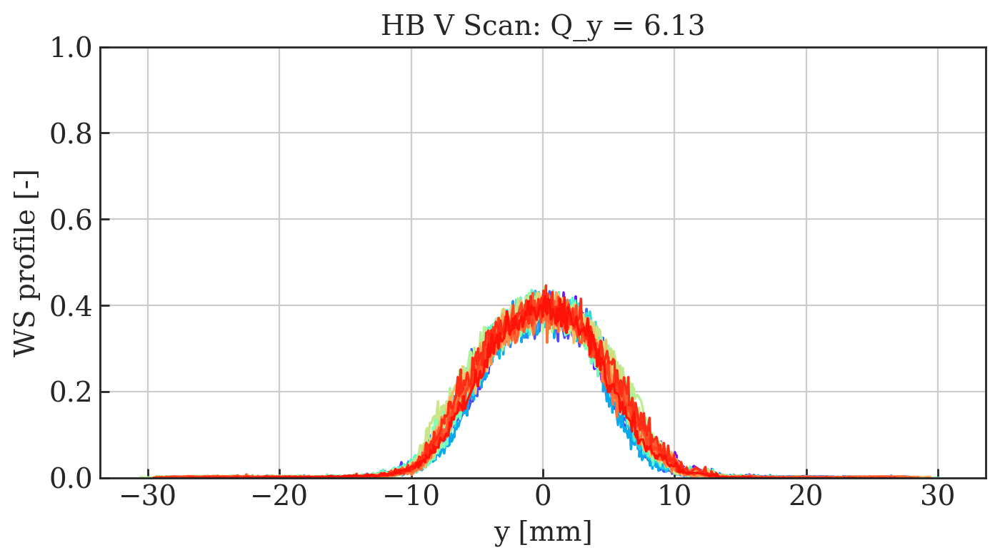

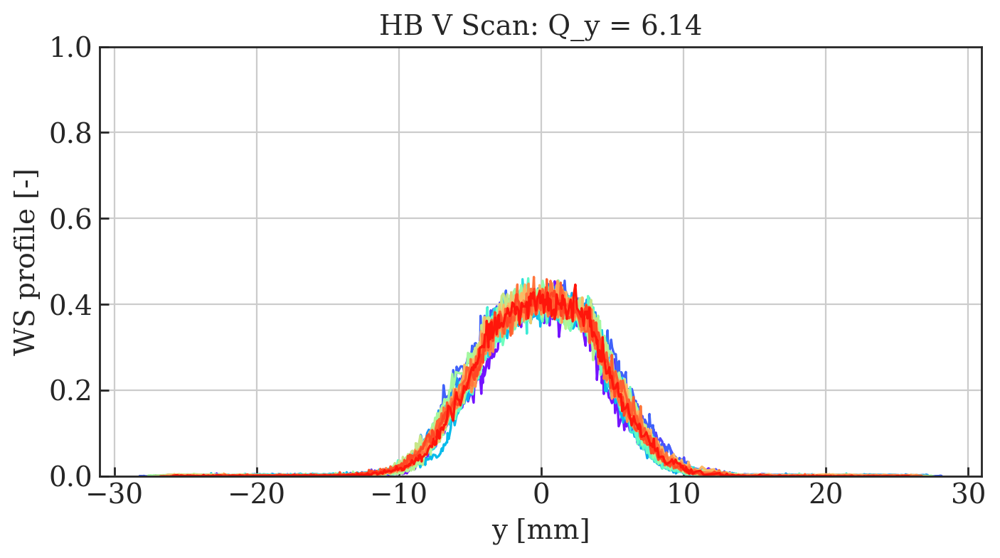

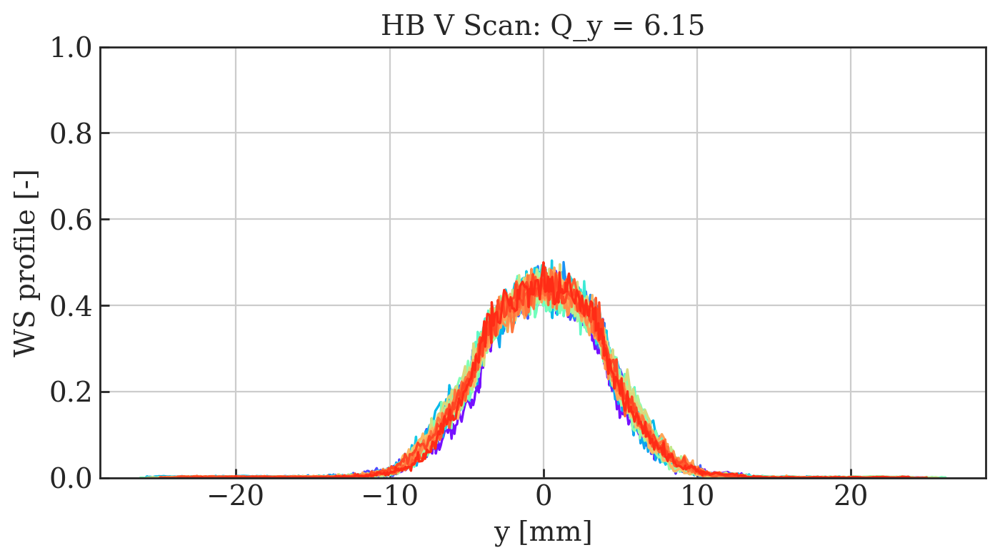

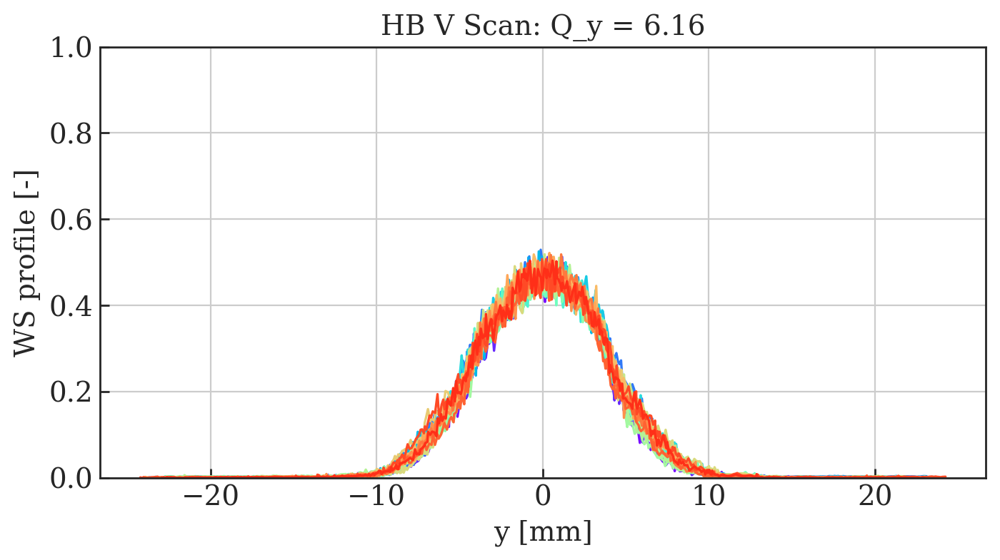

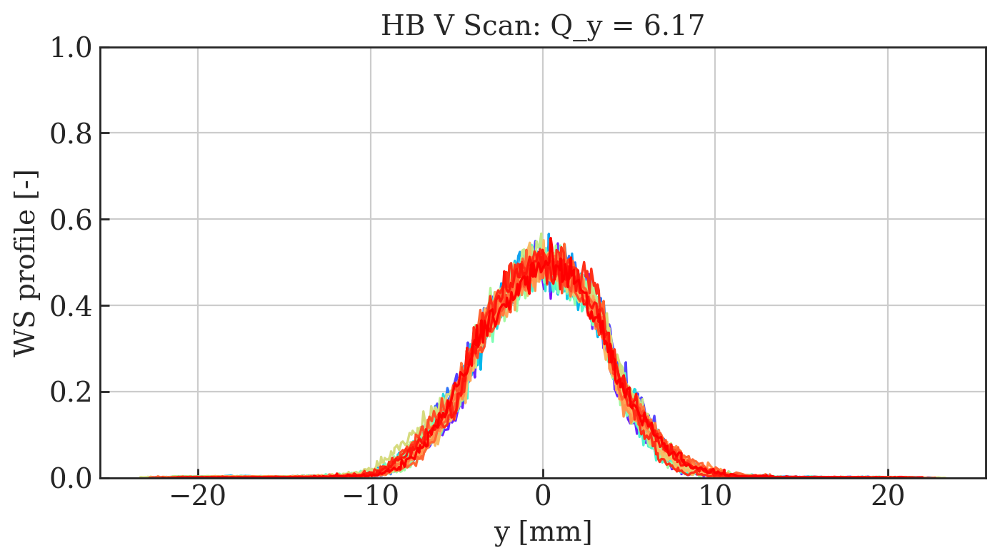

...

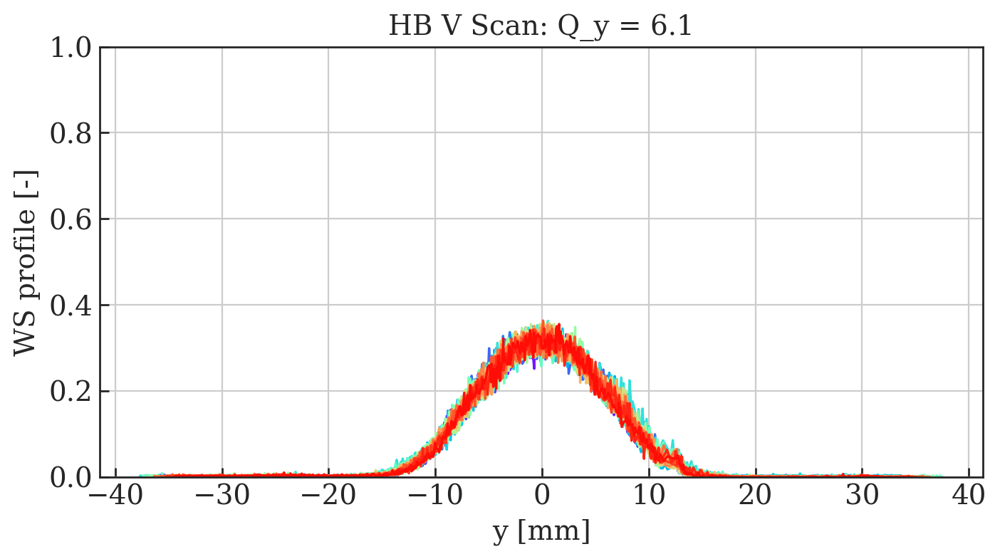

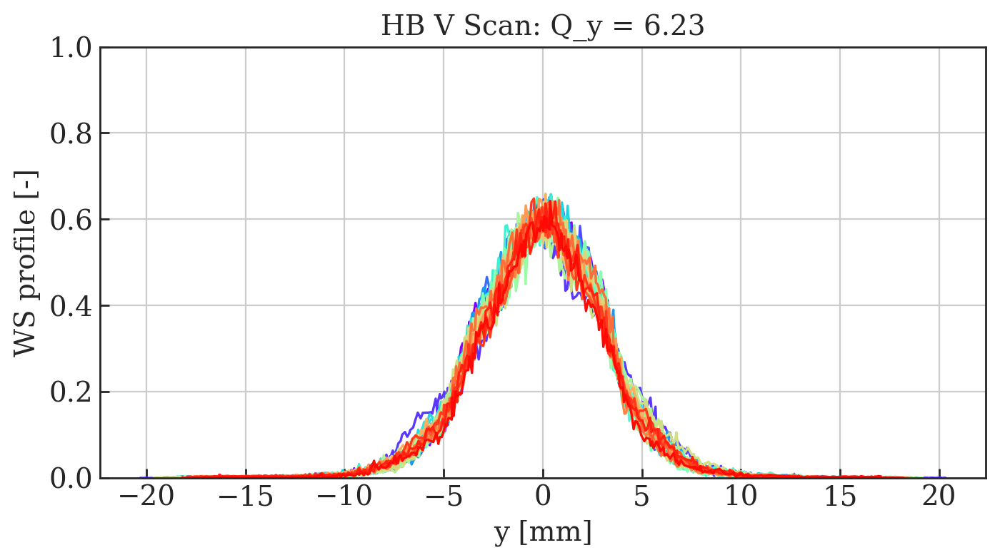

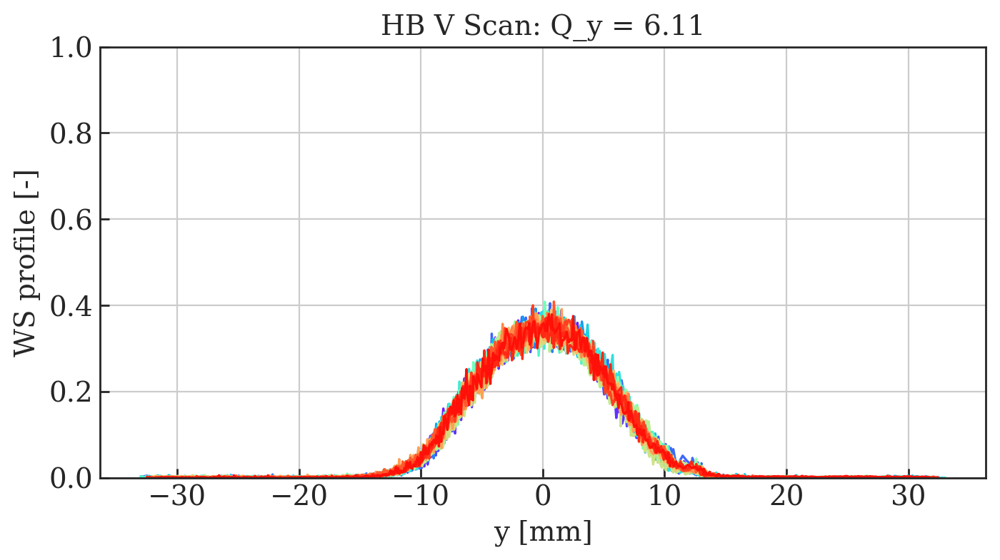

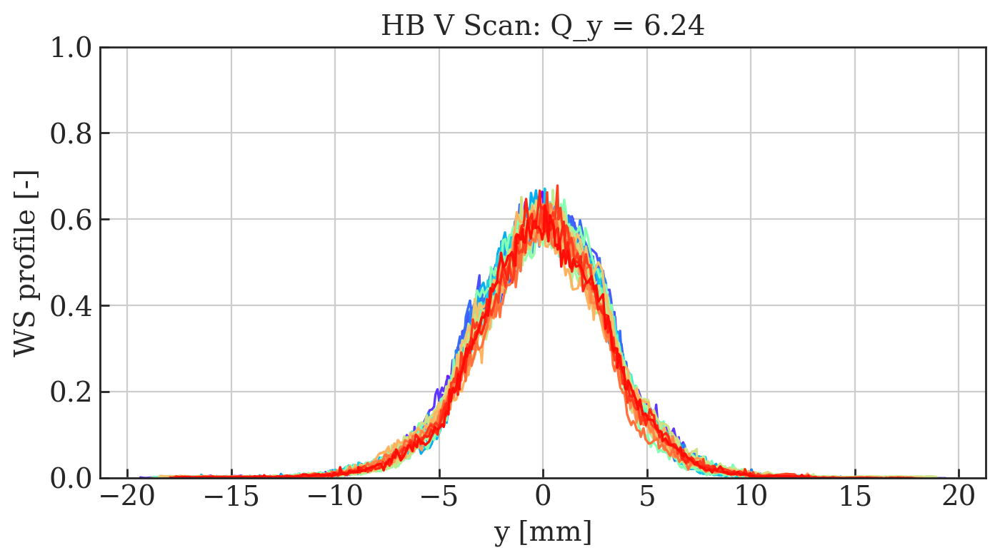

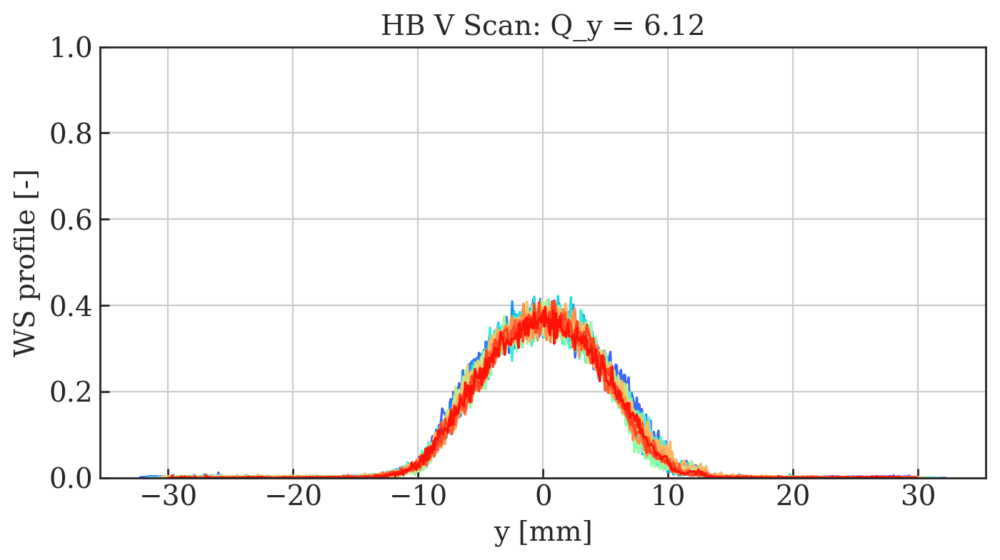

In [49]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position V'].iloc[value[i]], df0['profile V'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

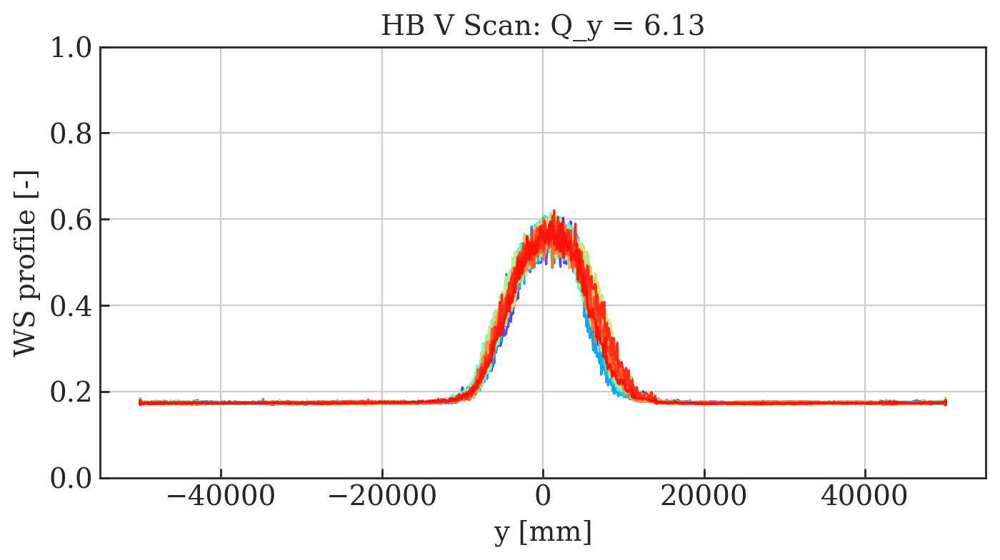

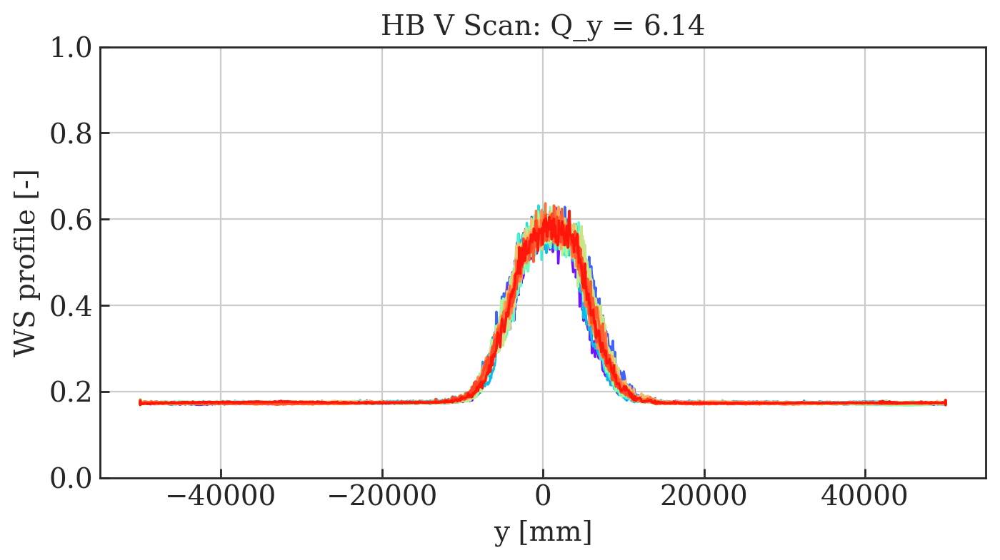

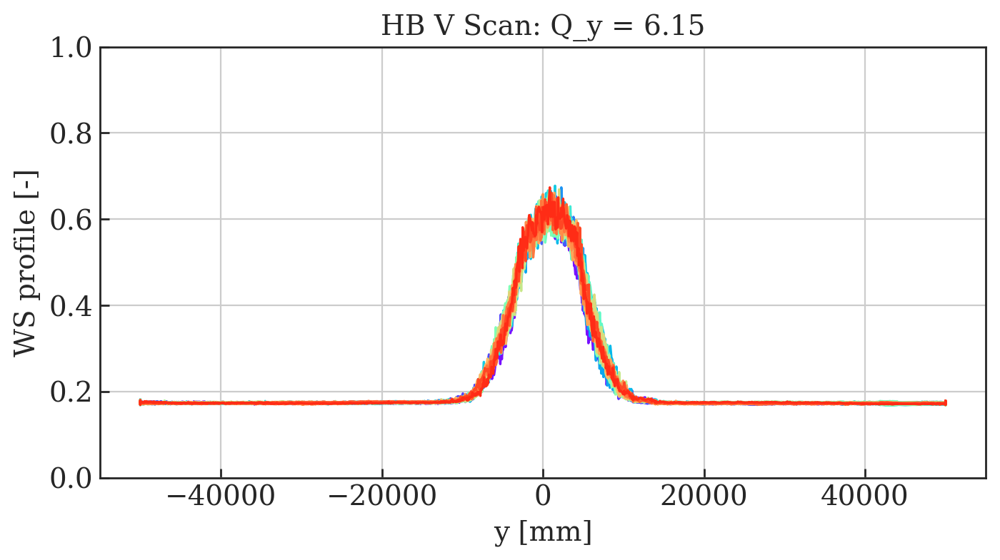

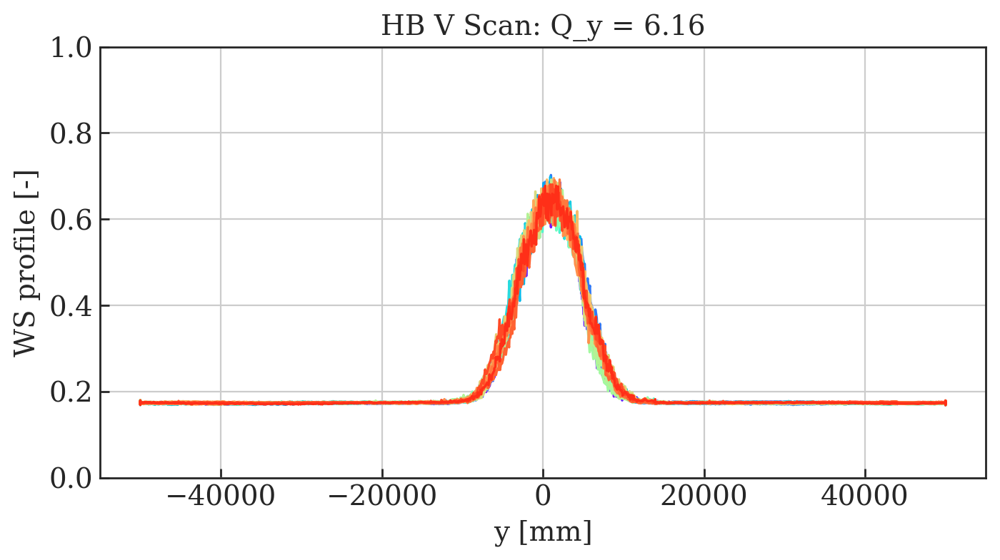

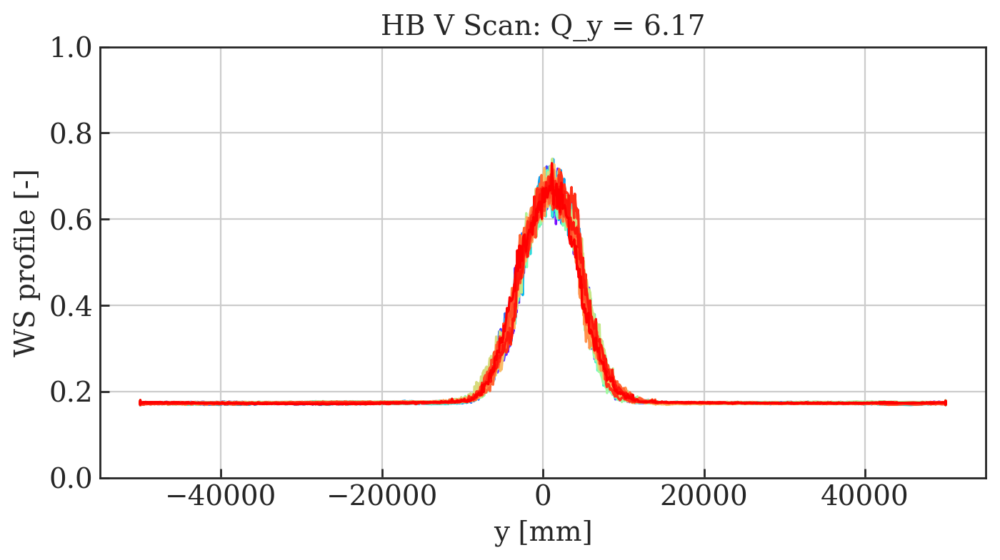

...

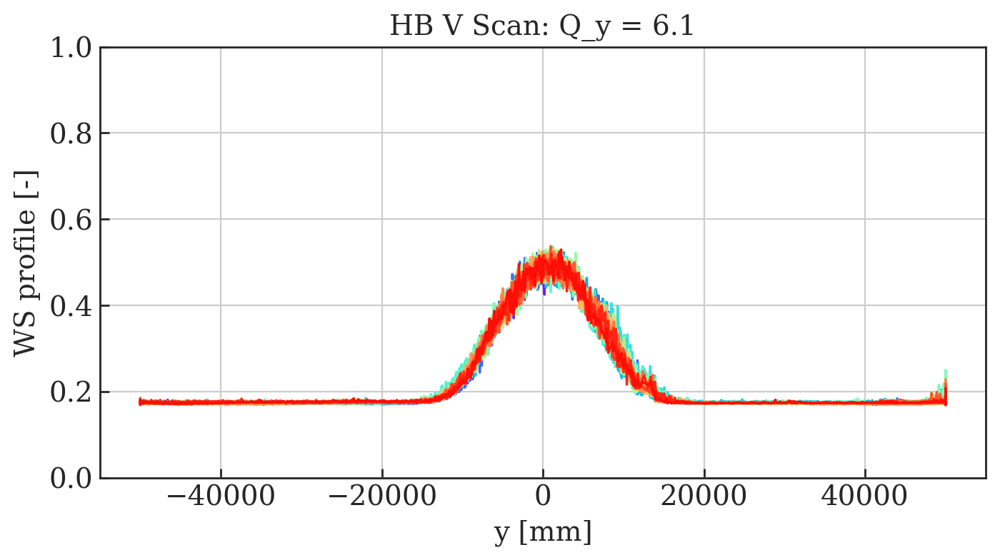

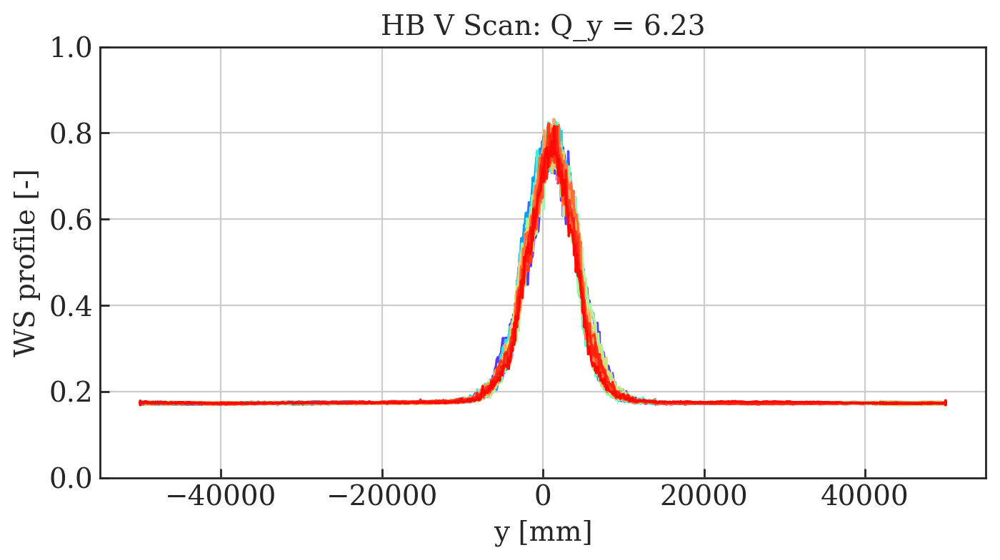

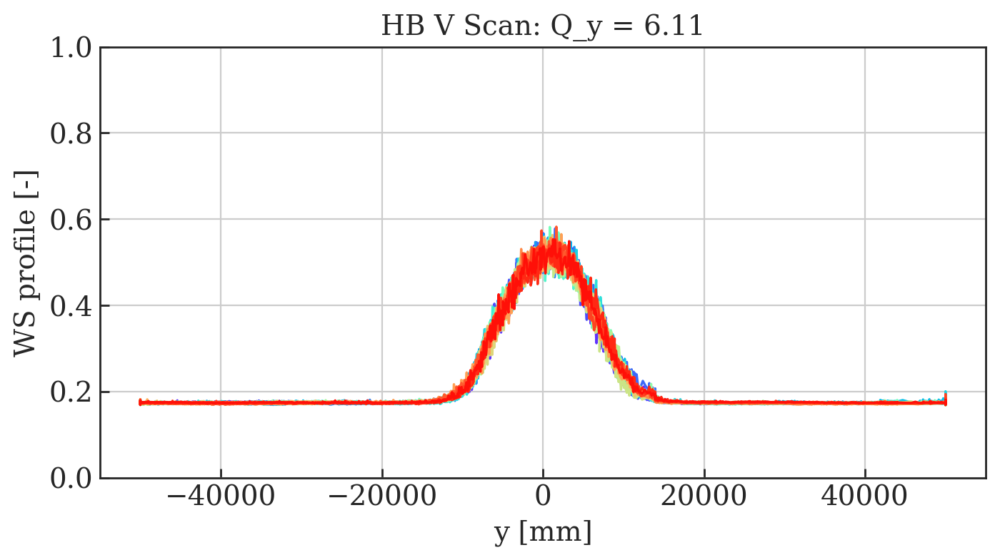

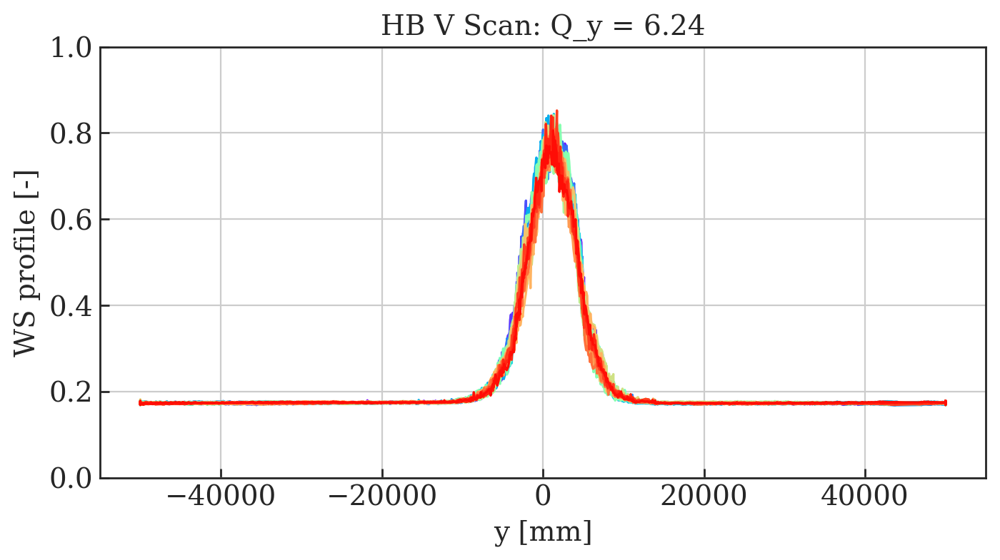

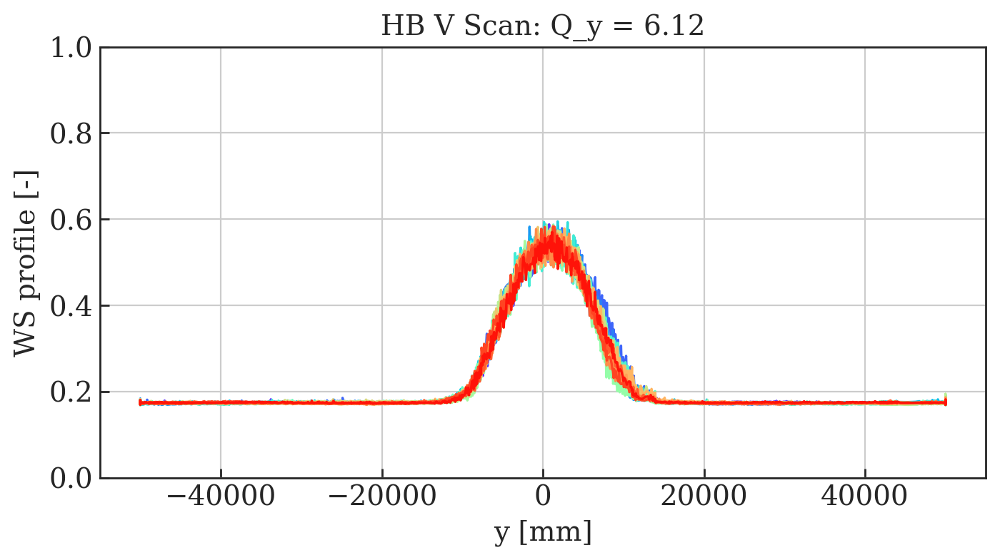

In [50]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.64.V_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.64.V_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('y [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_y = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Vertical_Manual_Fit_WS_Profiles_Raw_Qy=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Vertical emittance

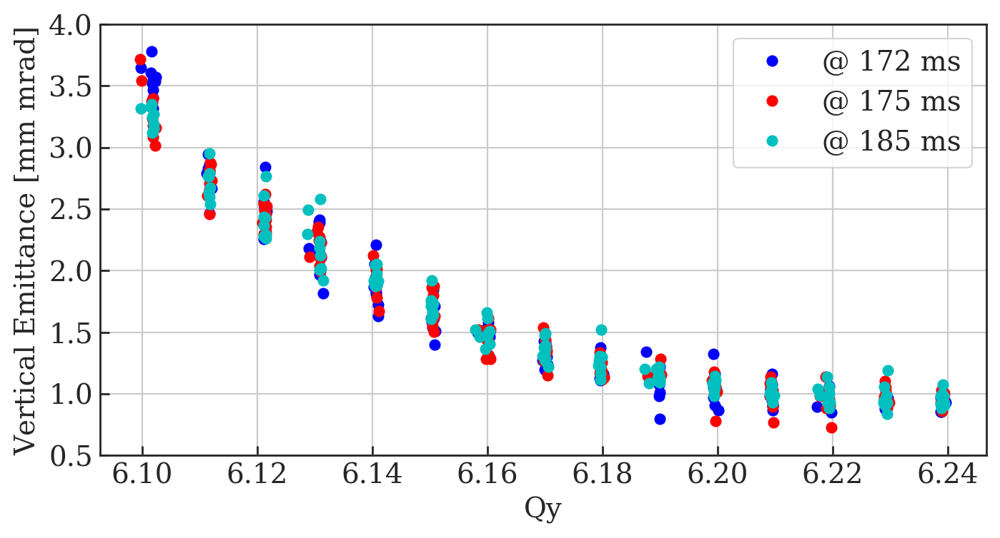

In [85]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
plt.ylim(0.5, 4);
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

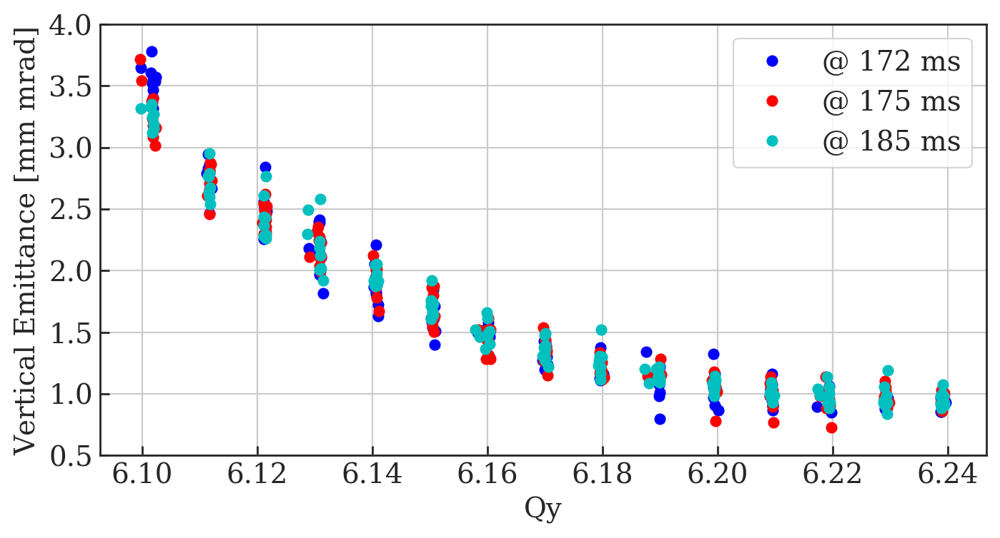

In [86]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qy'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)]+6, df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
plt.ylim(0.5, 4);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

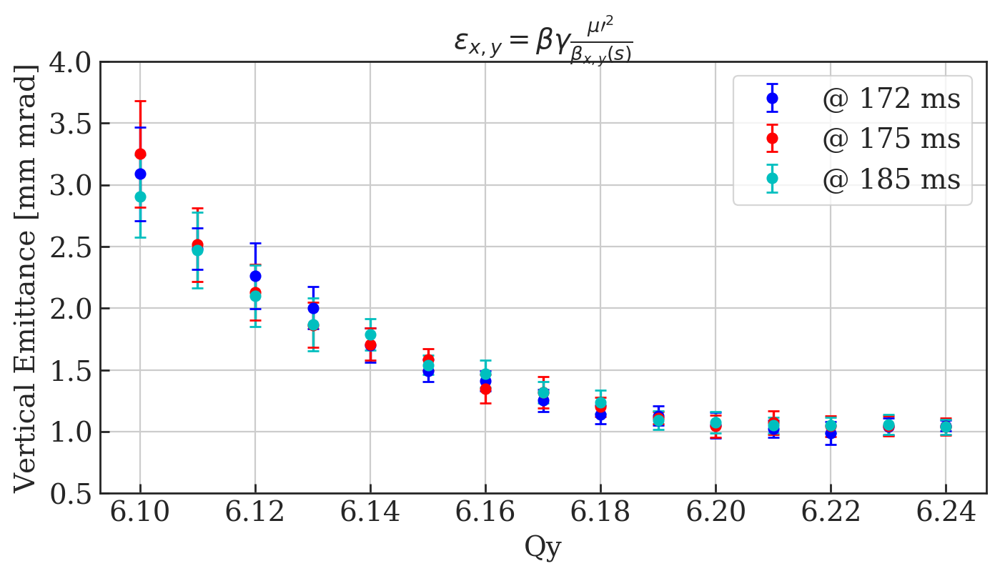

In [87]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

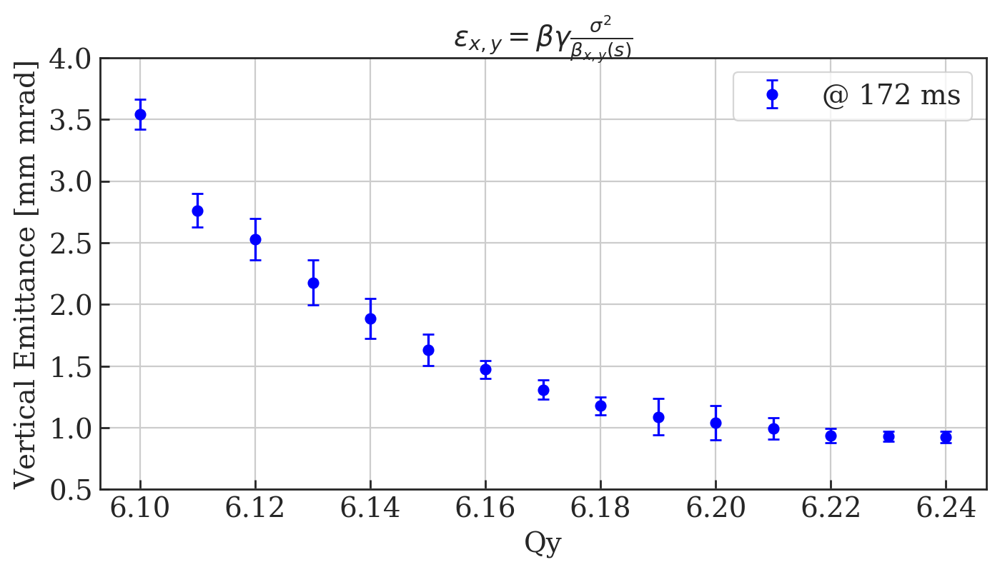

In [88]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
        
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_172.png');

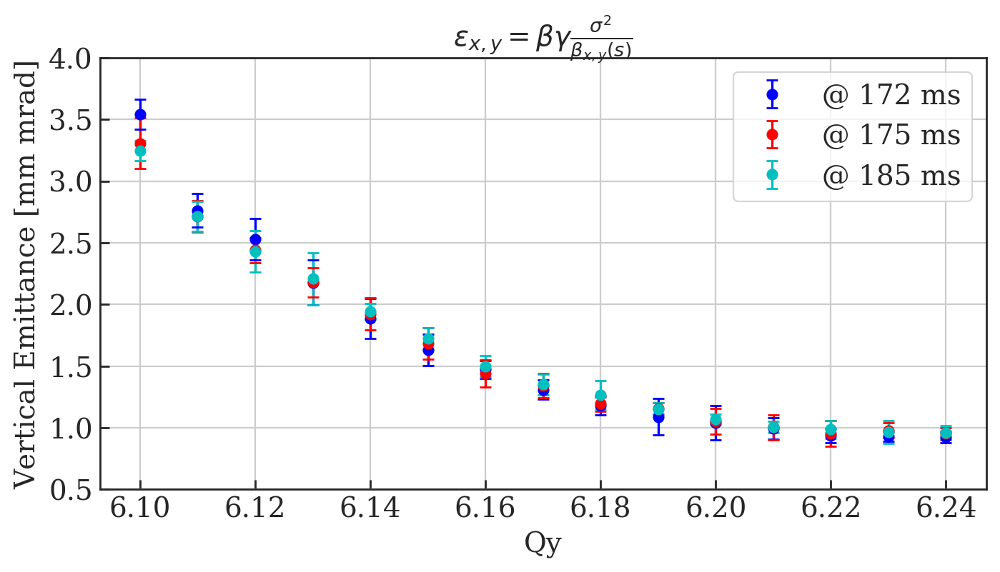

In [55]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

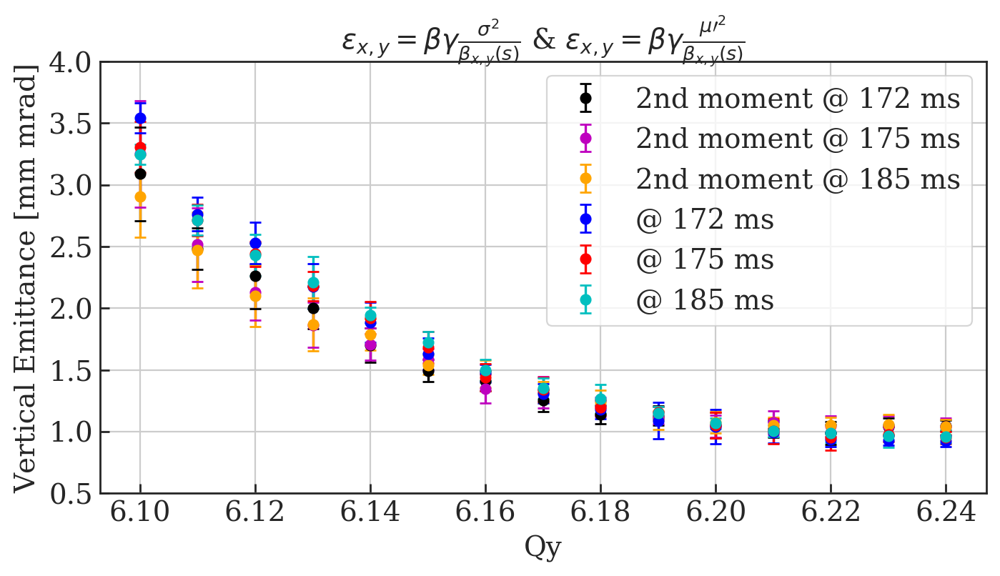

In [89]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4);
plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

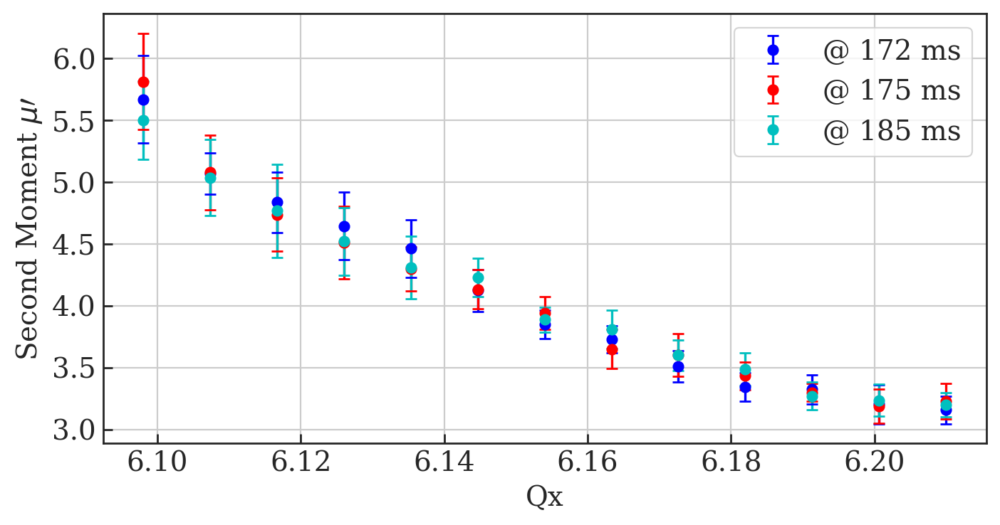

In [57]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

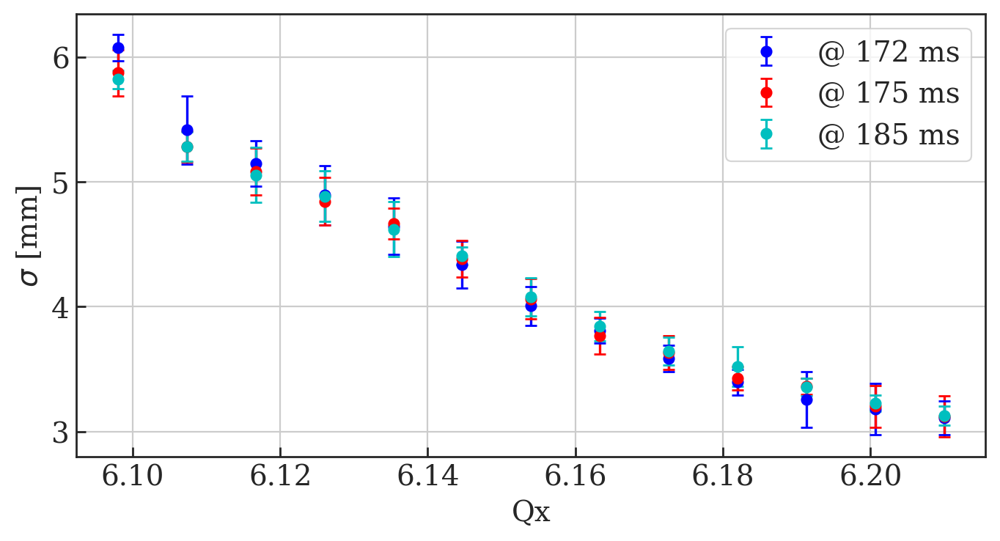

In [58]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

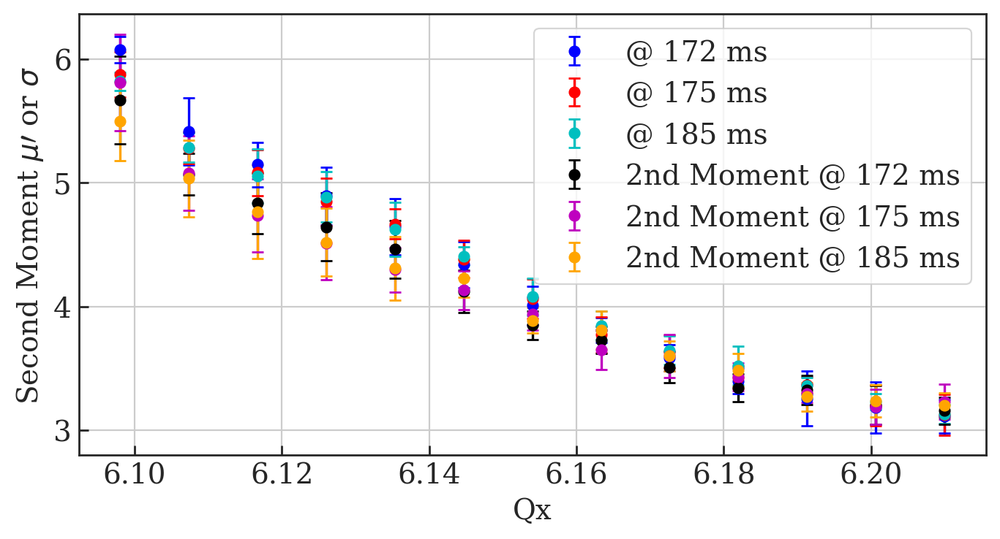

In [59]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==175)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==185)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [60]:
np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>.05)][(df0['Qy']<.1045)] )

3.5406945919238786

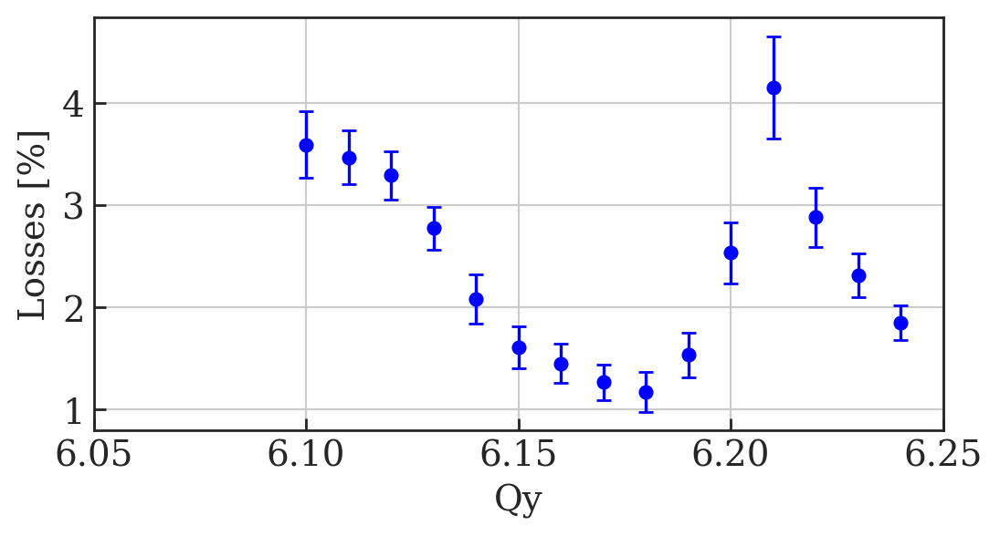

In [61]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qy');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [62]:
# Read .mat files into a dictionary

# matfiles = glob.glob("13_May/*.mat")
#matfiles = glob.glob("../Simulation_Output/V_Scan_Matched_Initial/Bunch_Profiles/*.mat")
matfiles = glob.glob("../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[-1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'610_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat',
 '611_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/611_SbS_c172.mat',
 '612_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/612_SbS_c172.mat',
 '613_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/613_SbS_c172.mat',
 '614_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/614_SbS_c172.mat',
 '615_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/615_SbS_c172.mat',
 '616_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/616_SbS_c172.mat',
 '617_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/617_SbS_c172.mat',
 '618_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/618_SbS_c172.mat',
 '619_SbS_c172': '../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/619_SbS_c172.mat',
 '620_SbS_c172': '../MD4224_Re

# Dictionary of tune points

In [63]:
# These are our tune points:
scan_points = np.linspace(610, 624, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21, 6.22, 6.23, 6.24]


In [64]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qy'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qy'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.1: array([ 13,  28,  42,  57,  72,  99, 114, 129, 144, 159, 173, 186, 201,
        214, 228, 243, 258, 272, 286, 300, 314, 329, 343, 356, 371, 384,
        397, 410]),
 6.11: array([ 12,  27,  41,  56,  71,  86,  98, 113, 128, 143, 158, 172, 200,
        227, 242, 257, 271, 285, 299, 313, 328, 342, 370, 383, 396, 409]),
 6.12: array([ 26,  55,  70,  85, 112, 127, 142, 157, 171, 185, 199, 213, 226,
        241, 256, 270, 284, 298, 312, 327, 341, 369, 382, 408]),
 6.13: array([ 11,  25,  40,  54,  69,  84,  97, 111, 126, 141, 156, 170, 184,
        198, 212, 225, 240, 255, 269, 283, 297, 311, 326, 340, 355, 368,
        381, 395, 407]),
 6.14: array([ 10,  24,  39,  53,  68,  83,  96, 110, 125, 140, 155, 169, 183,
        197, 211, 224, 239, 254, 268, 296, 310, 325, 339, 354, 367, 380,
        406]),
 6.15: array([  9,  23,  38,  52,  67,  82,  95, 109, 124, 139, 154, 182, 196,
        210, 223, 238, 253, 267, 282, 295, 309, 324, 338, 353, 366, 379,
        394]),
 6.16: array([  8,  

# Function to find Peak

# Test Peakfinder

In [65]:
peak = peakfinder(np.array(df0['position V'].iloc[0]), np.array(df0['profile V'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6638534591783954
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  192
	index of x_dat =  -0.03379243863650805  is  192
	Mean of peak point +/- 3 points =  0.638239823191498
0.638239823191498


	 using peak value
peak @ 85.9493402124039


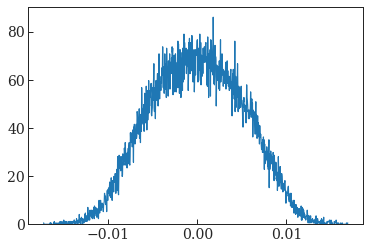

In [66]:
matfiles = glob.glob("../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x))
print 'peak @', peak

plt.plot(bins_[:-1], x);

# Check all simulation data peaks

In [67]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat

	MAX(y_dat) =  85.9493402124039
	x_dat[index] =  0.0017797724656246315
	index of x_dat =  0.0017797724656246315  is  557
	Mean of peak point +/- 3 points =  67.32280681360598
	 using peak value

 peak =  85.9493402124039 

../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/611_SbS_c172.mat

	MAX(y_dat) =  94.77478681321182
	x_dat[index] =  0.0005599006520665174
	index of x_dat =  0.0005599006520665174  is  531
	Mean of peak point +/- 3 points =  75.49420179244508
	 using peak value

 peak =  94.77478681321182 

../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/612_SbS_c172.mat

	MAX(y_dat) =  104.87655016206725
	x_dat[index] =  0.0009594544221319425
	index of x_dat =  0.0009594544221319425  is  529
	Mean of peak point +/- 3 points =  89.29829636364194

 peak =  89.29829636364194 

../MD4224_Repo_Outputs/V_Mini_Optimised/Simulation_Profiles/613_SbS_c172.mat

	MAX(y_dat) =  102.62073561729935

# Plot wirescanner profiles with simulation data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms]
MD points:  [13, 57, 99, 144, 186, 228, 272, 314, 356, 397]
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value
	 using peak value

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms]
MD points:  [12, 56, 98, 143, 227, 271, 313, 396]

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms]
MD points:  [55, 142, 185, 226, 270, 312]

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms]
MD points:  [11, 54, 97, 141, 184, 225, 269, 311, 355, 395]

Importing simulation file: 614_SbS_c172
Qy =  6.14 , ctime = 172.0 [ms]
MD points:  [10, 53, 96, 140, 183, 224, 268, 310, 354]

Importing simulation file: 615_SbS_c172
Qy =  6.15 , ctime = 172.0 [ms]
MD points:  [9, 52, 95, 139, 182, 223, 267, 309, 353, 394]

Importing simulation file: 616_SbS_c172
Qy =  

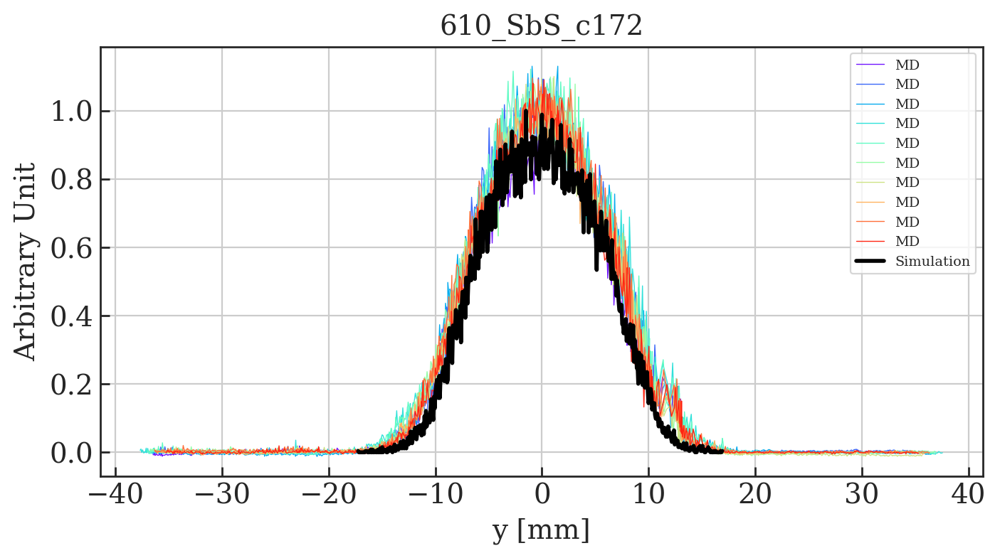

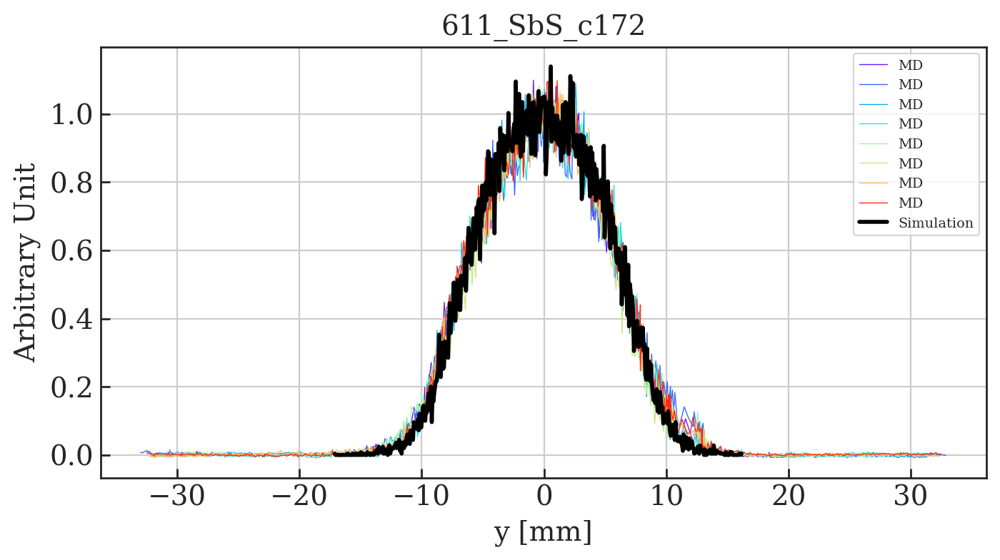

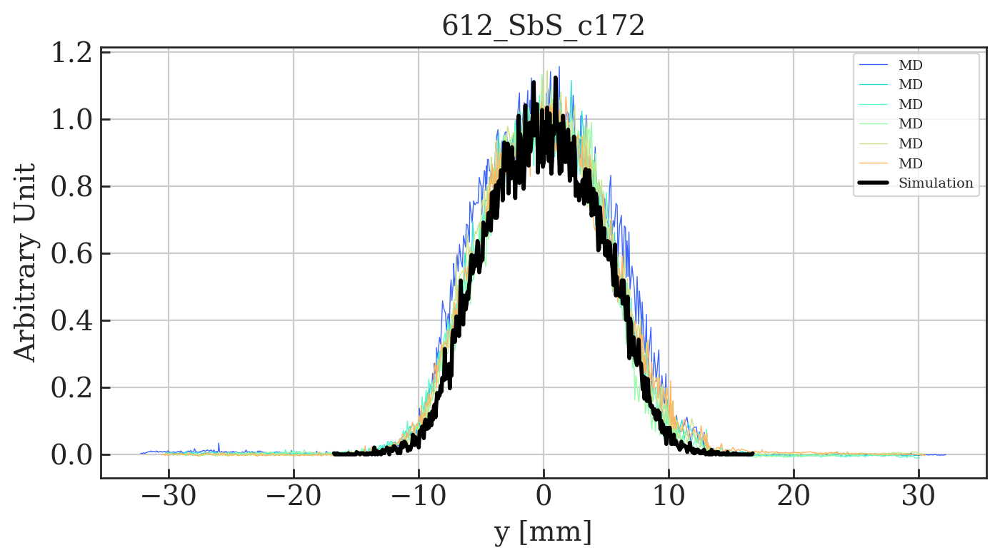

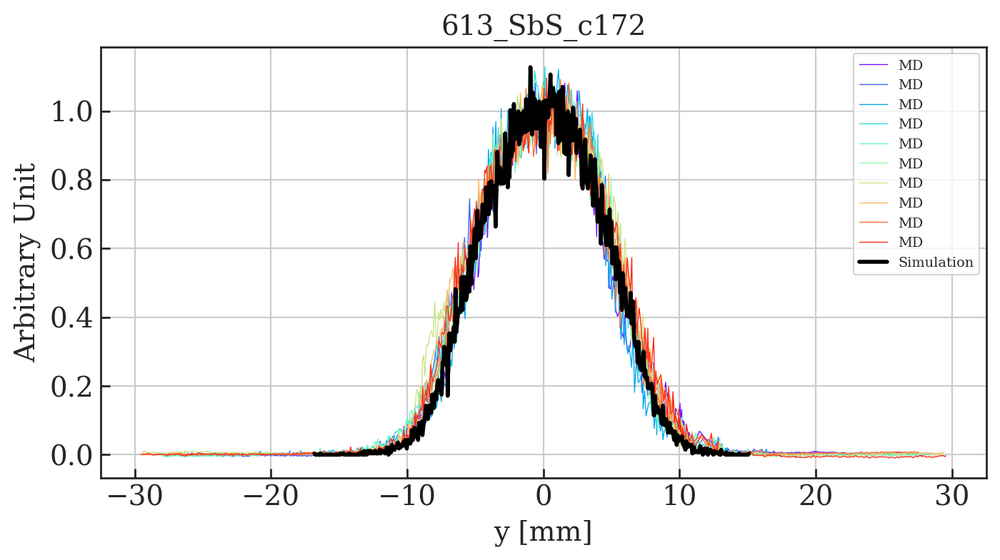

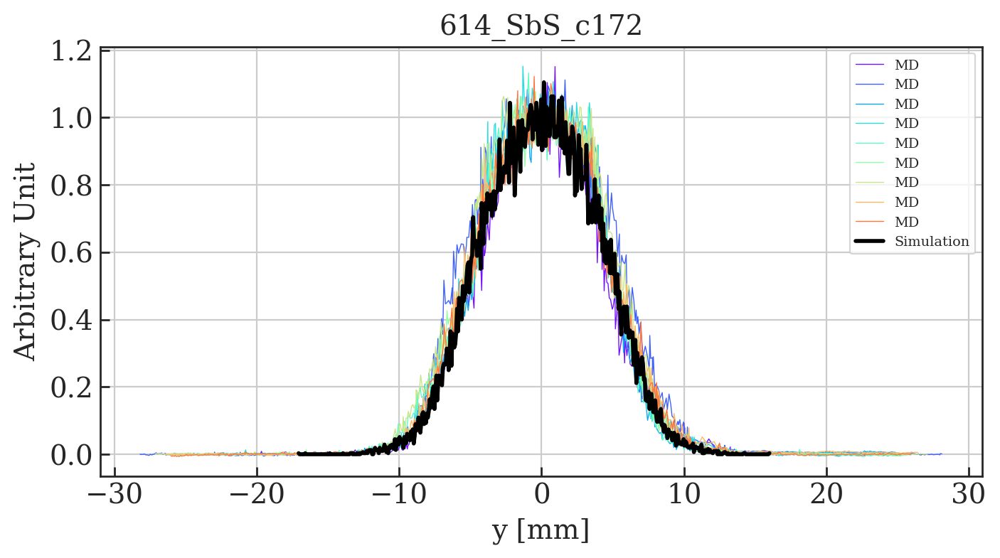

...

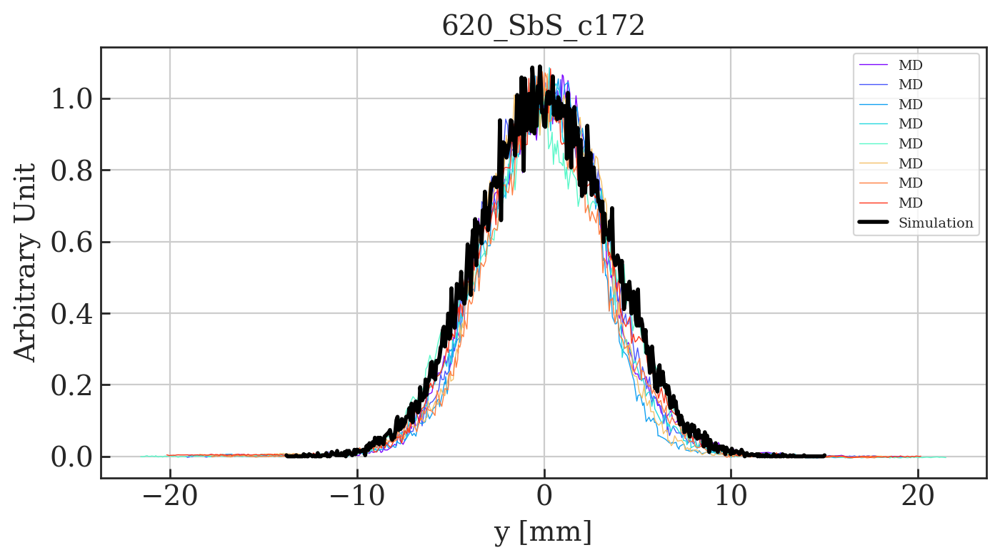

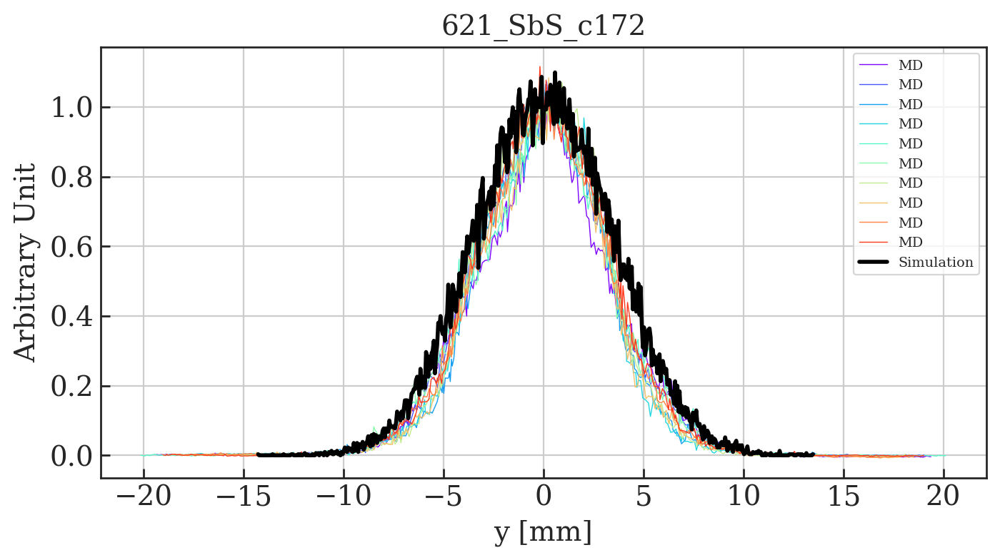

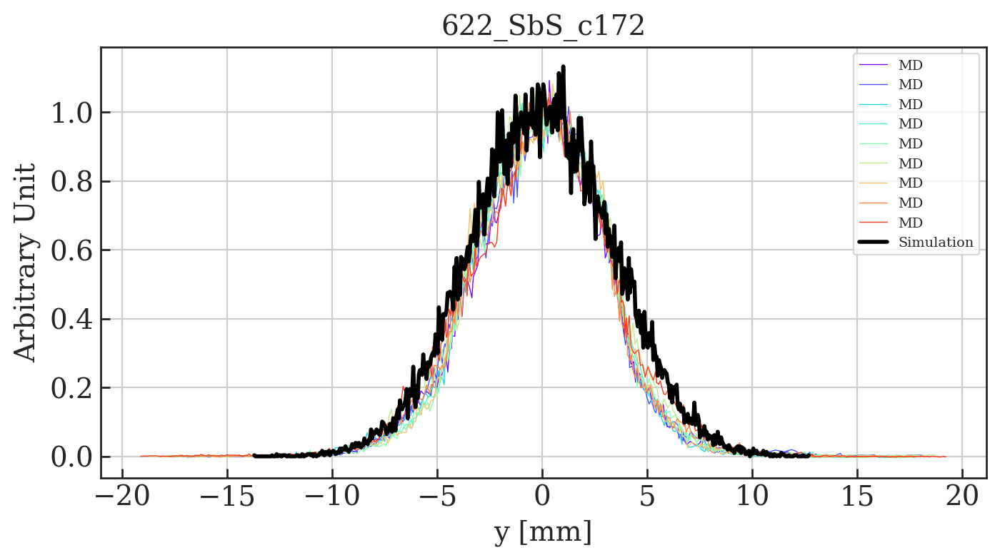

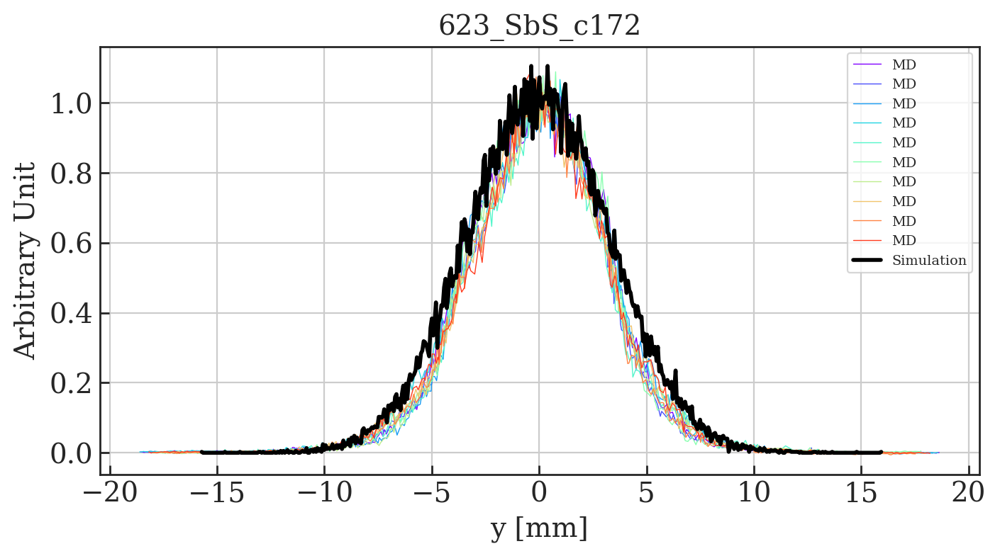

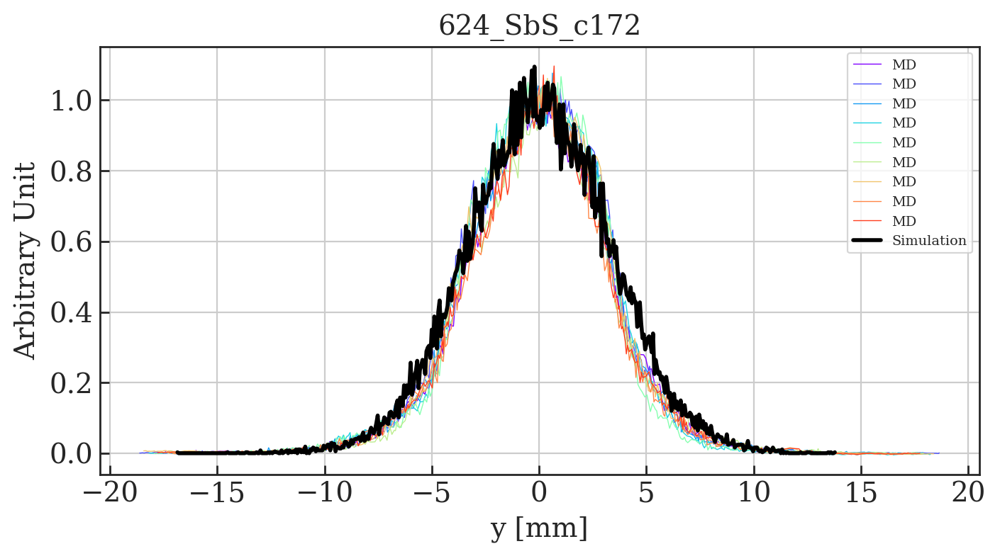

In [68]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_y]:
        if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print 'MD points: ', md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, 1, main_label, 500)  

# Compare SC Models only


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.14052285952864702
	x_dat[index] =  0.52145929355963
	index of x_dat =  0.52145929355963  is  537
	Mean of peak point +/- 3 points =  0.12218874573382518

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.1385991226960395
	x_dat[index] =  -0.060740922758652616
	index of x_dat =  -0.060740922758652616  is  475
	Mean of peak point +/- 3 points =  0.11685359560087107

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.137001568284736
	x_dat[index] =  -0.2533225188708954
	index of x_dat =  -0.2533225188708954  is  460
	Mean of peak point +/- 3 points =  0.11463396529947066

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms], label =  SbS
[11, 54, 97

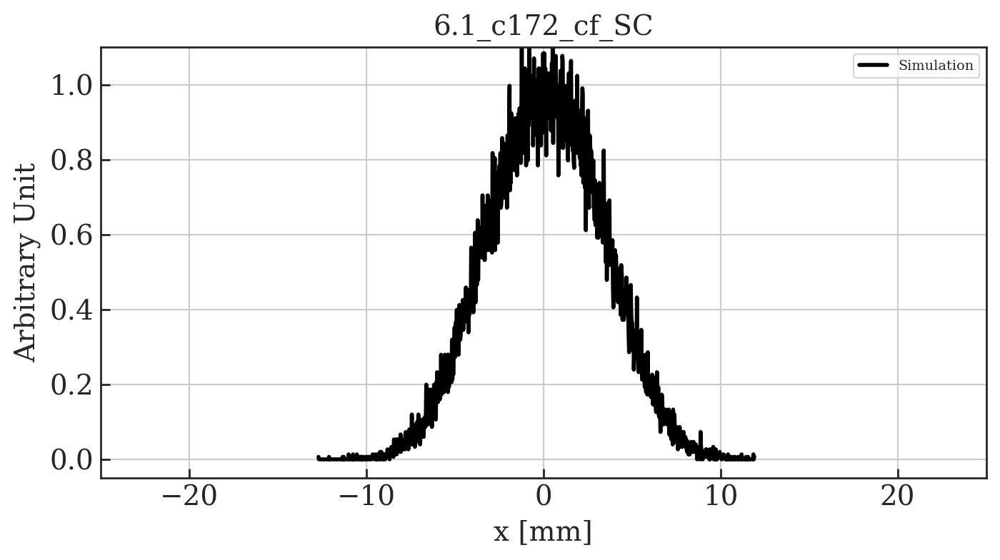

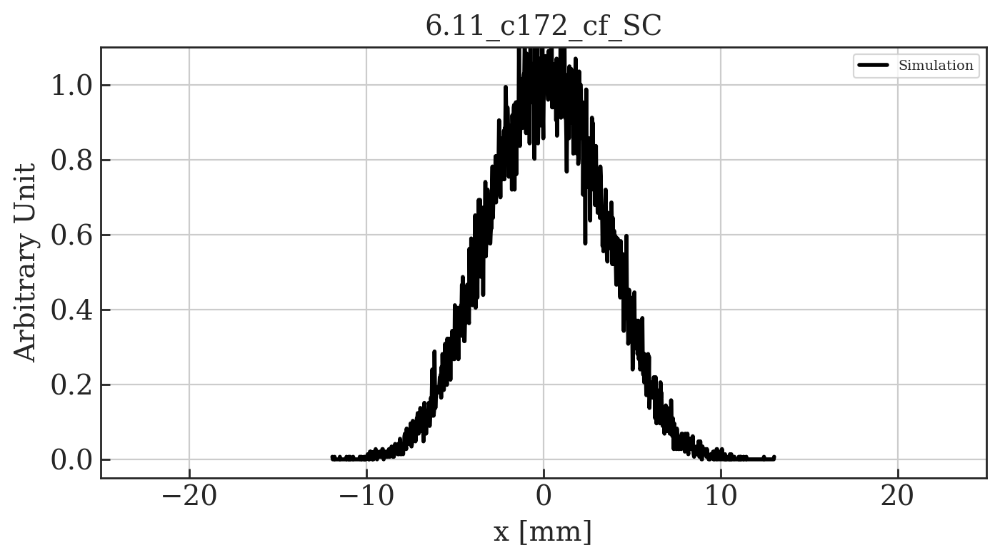

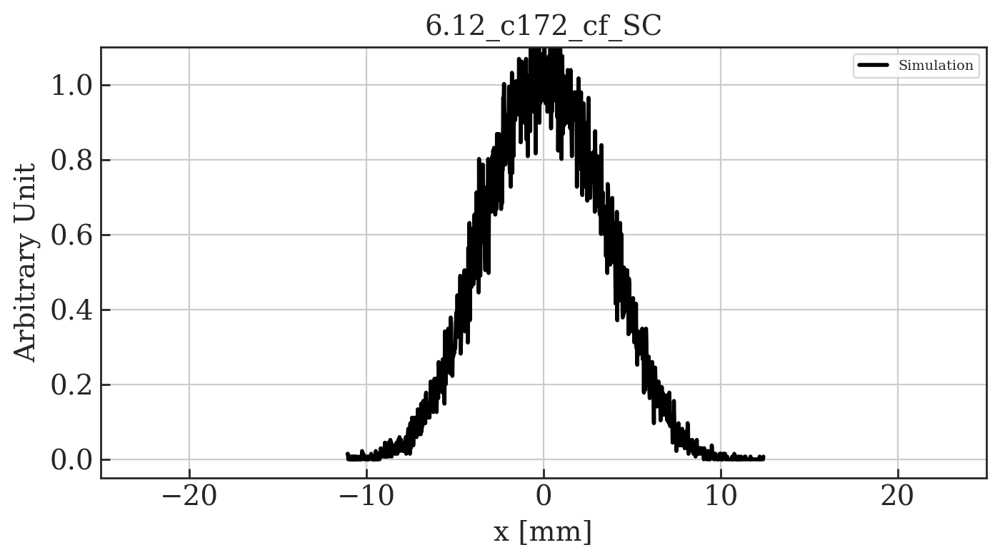

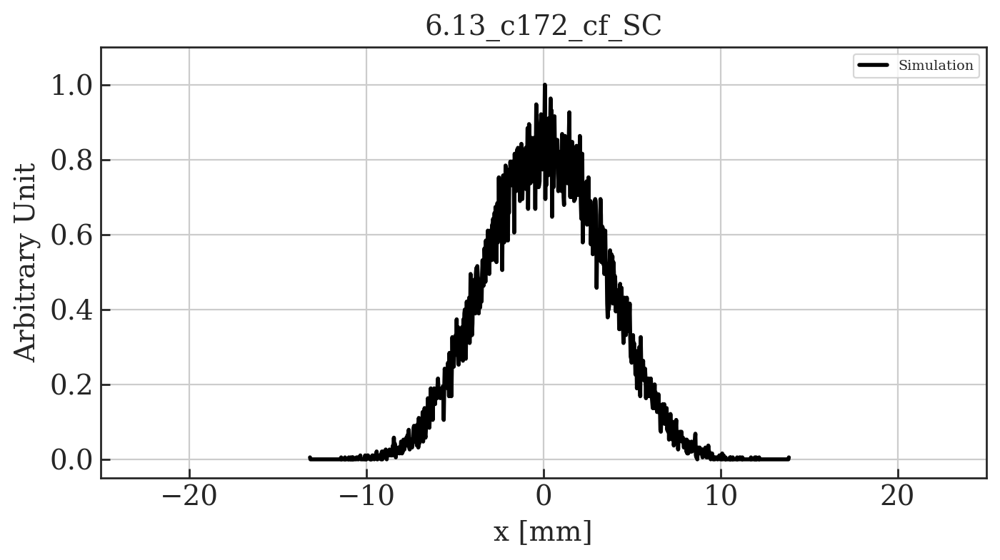

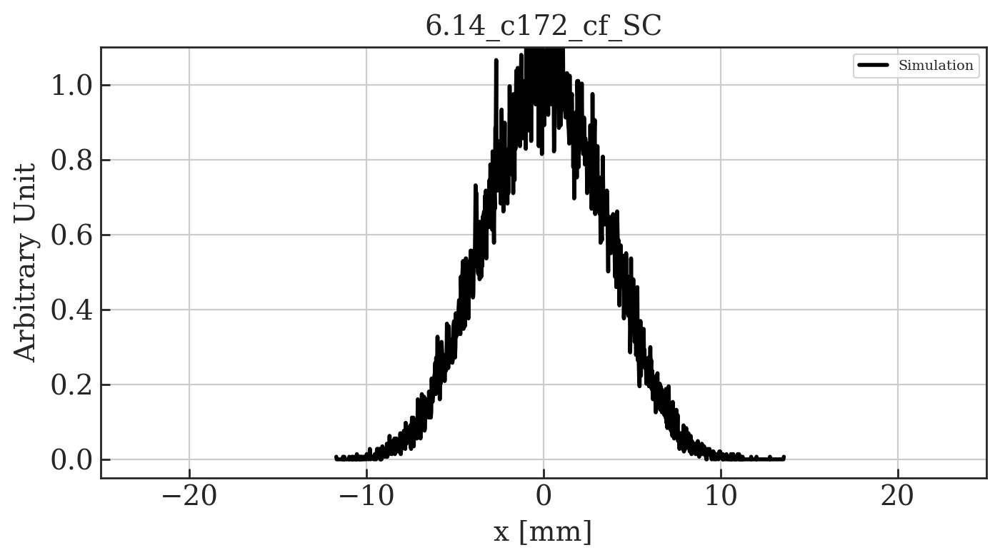

...

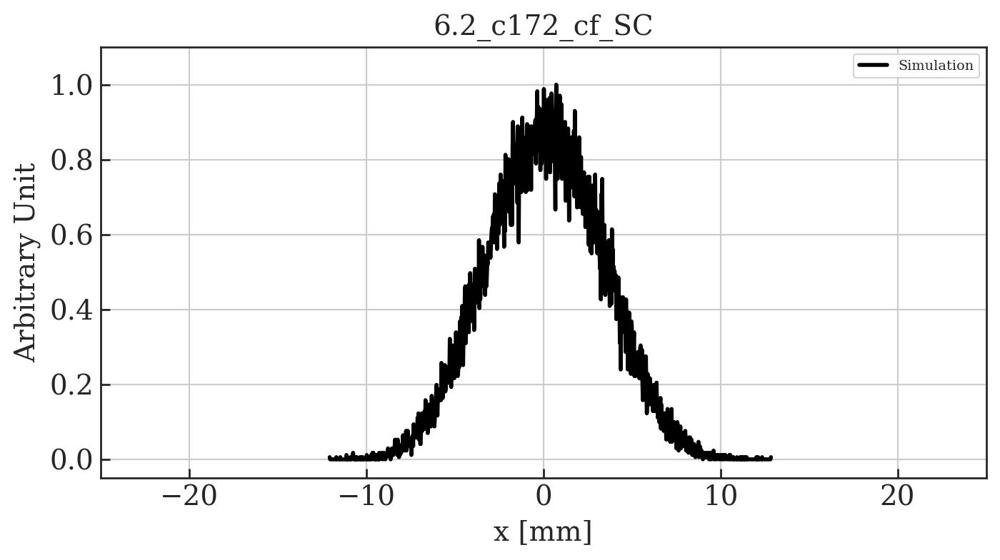

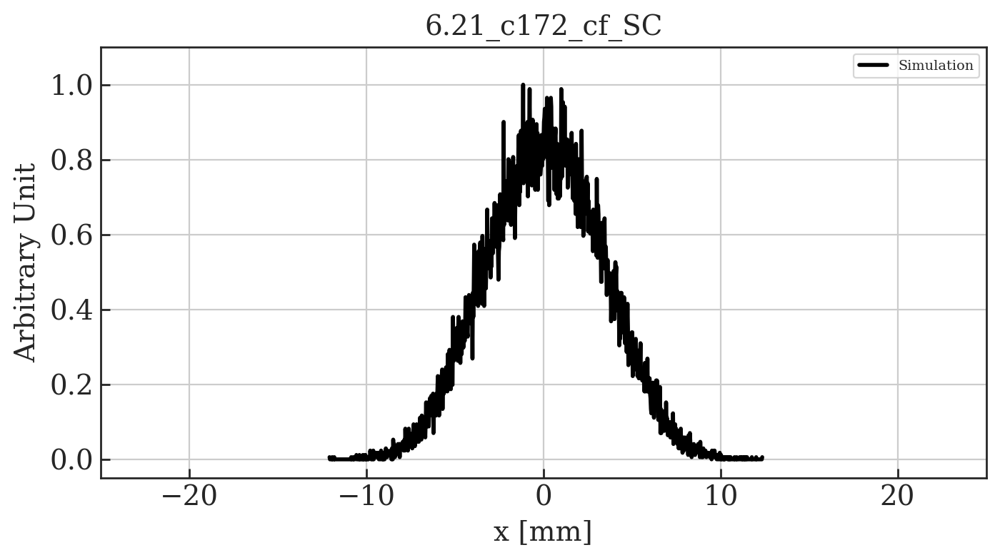

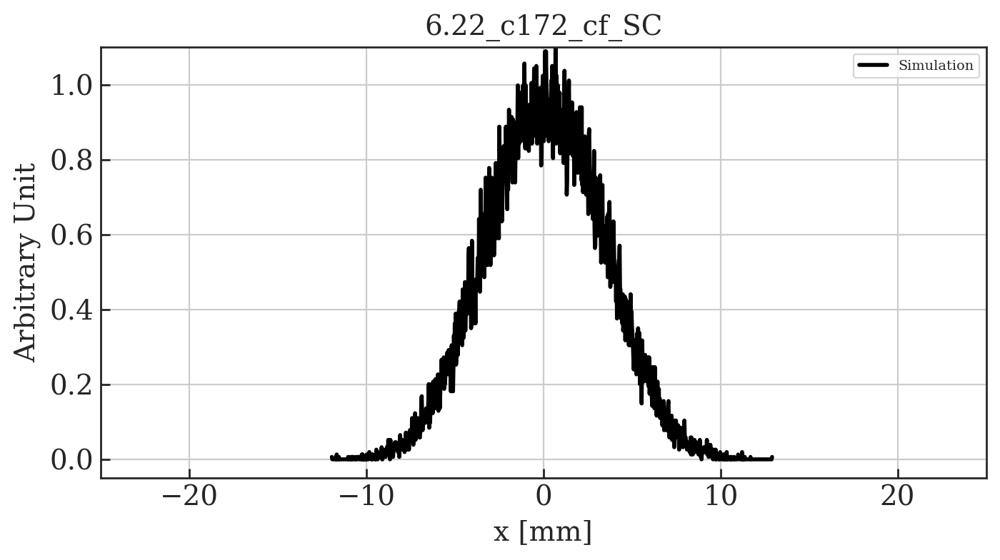

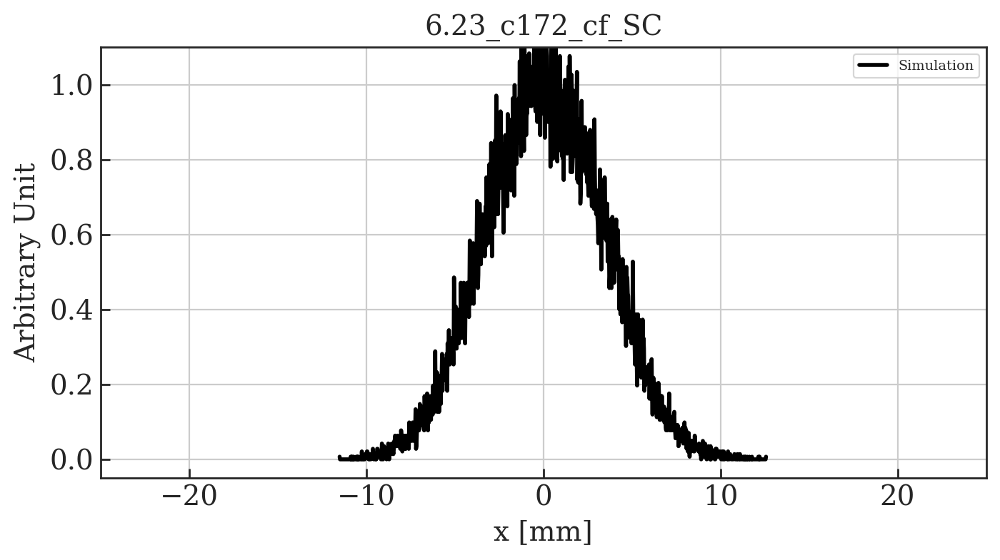

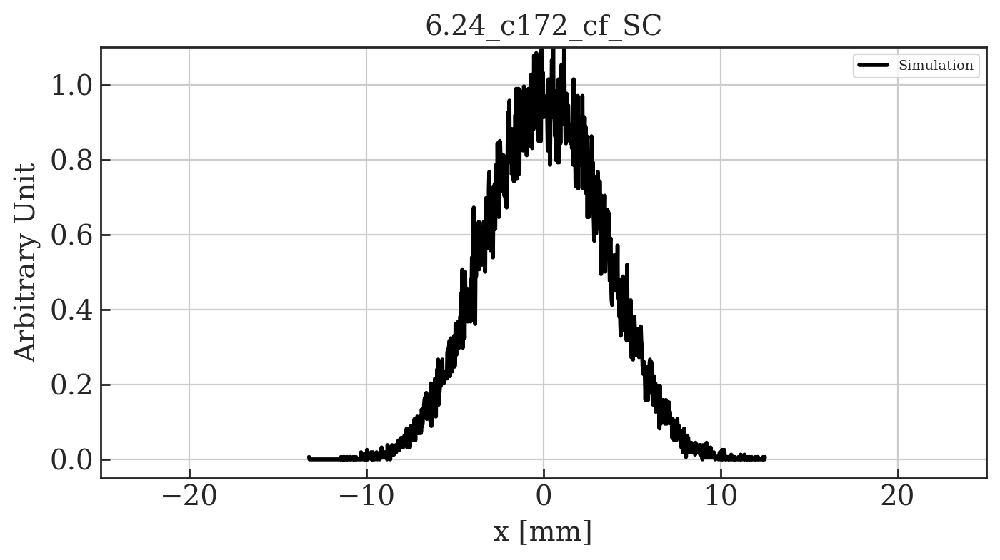

In [69]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=['Simulation']
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Compare Sims and MD data


Importing simulation file: 610_SbS_c172
Qy =  6.1 , ctime = 172.0 [ms], label =  SbS
[13, 57, 99, 144, 186, 228, 272, 314, 356, 397]

	MAX(y_dat) =  0.07250148426080616
	x_dat[index] =  -0.169980721378991
	index of x_dat =  -0.169980721378991  is  100
	Mean of peak point +/- 3 points =  0.06769032585824594

Importing simulation file: 611_SbS_c172
Qy =  6.11 , ctime = 172.0 [ms], label =  SbS
[12, 56, 98, 143, 227, 271, 313, 396]

	MAX(y_dat) =  0.07977877624150656
	x_dat[index] =  -0.14028557078177784
	index of x_dat =  -0.14028557078177784  is  102
	Mean of peak point +/- 3 points =  0.07417455286213544

Importing simulation file: 612_SbS_c172
Qy =  6.12 , ctime = 172.0 [ms], label =  SbS
[55, 142, 185, 226, 270, 312]

	MAX(y_dat) =  0.09081355820851562
	x_dat[index] =  -0.6851458219976188
	index of x_dat =  -0.6851458219976188  is  96
	Mean of peak point +/- 3 points =  0.08255623242465233

Importing simulation file: 613_SbS_c172
Qy =  6.13 , ctime = 172.0 [ms], label =  SbS
[11, 54

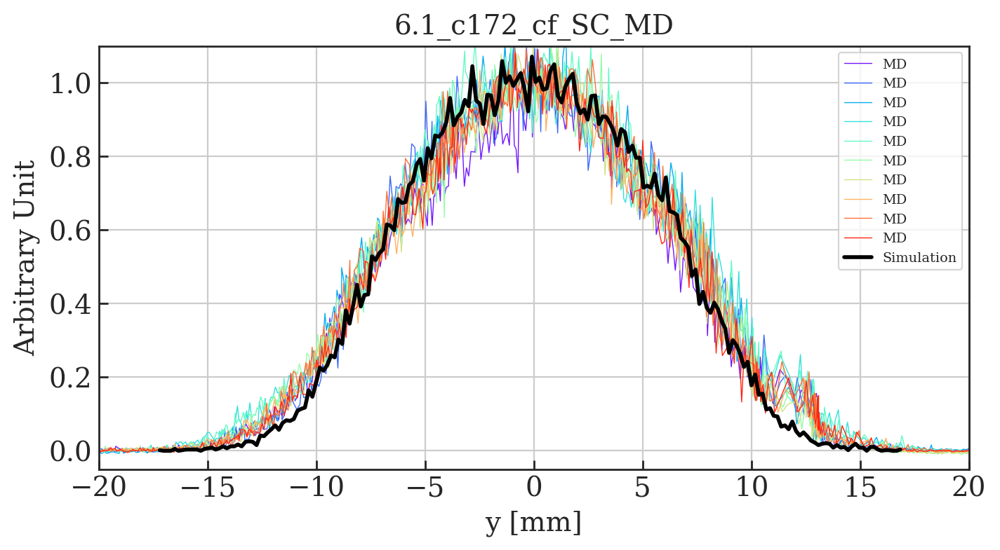

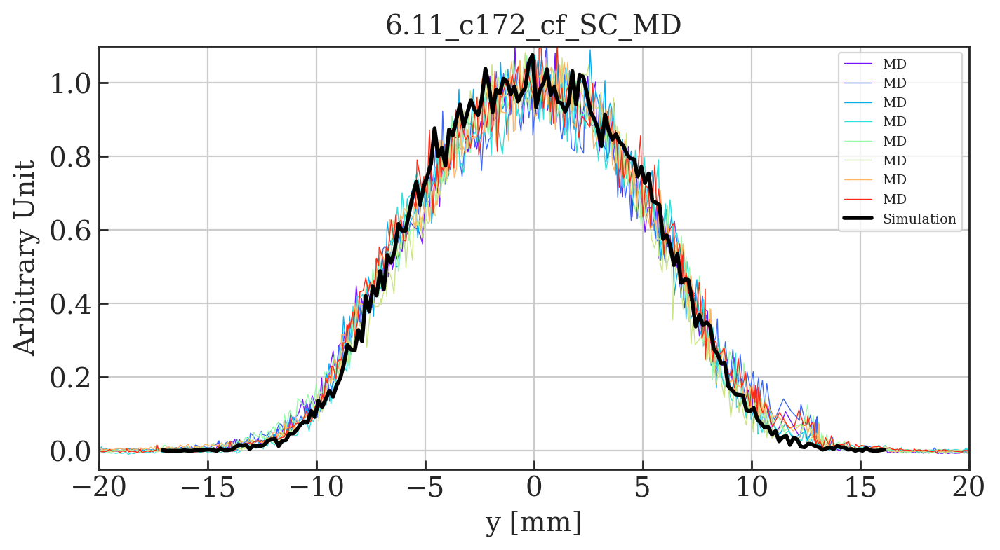

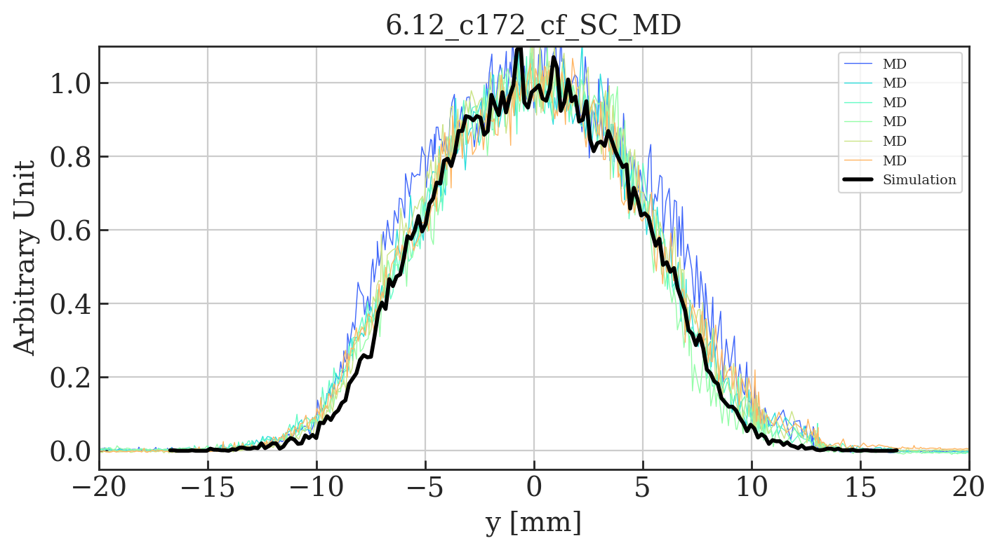

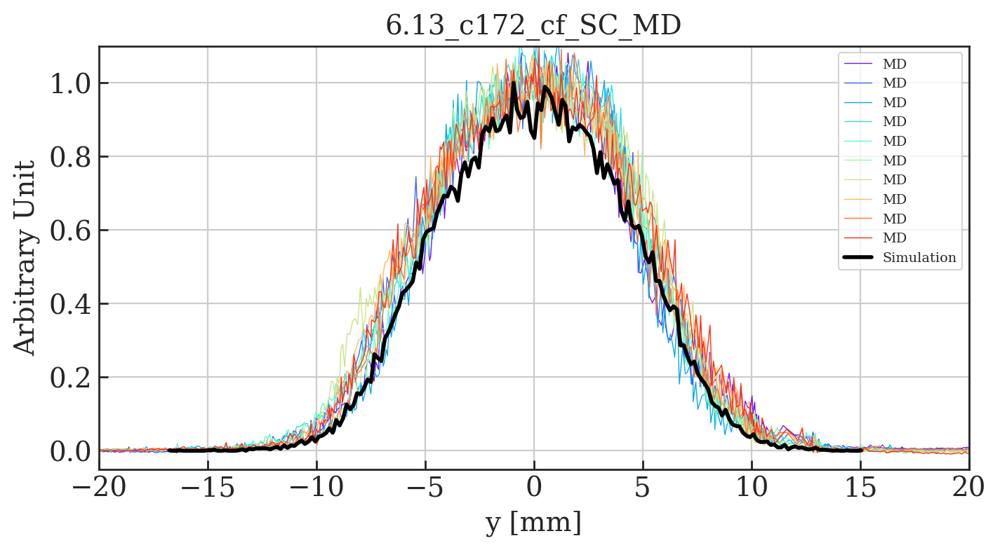

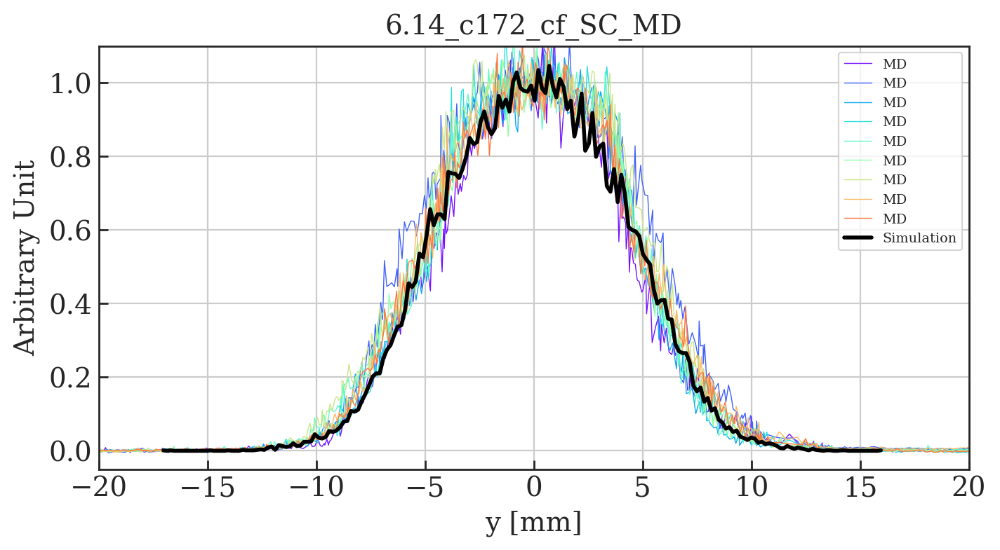

...

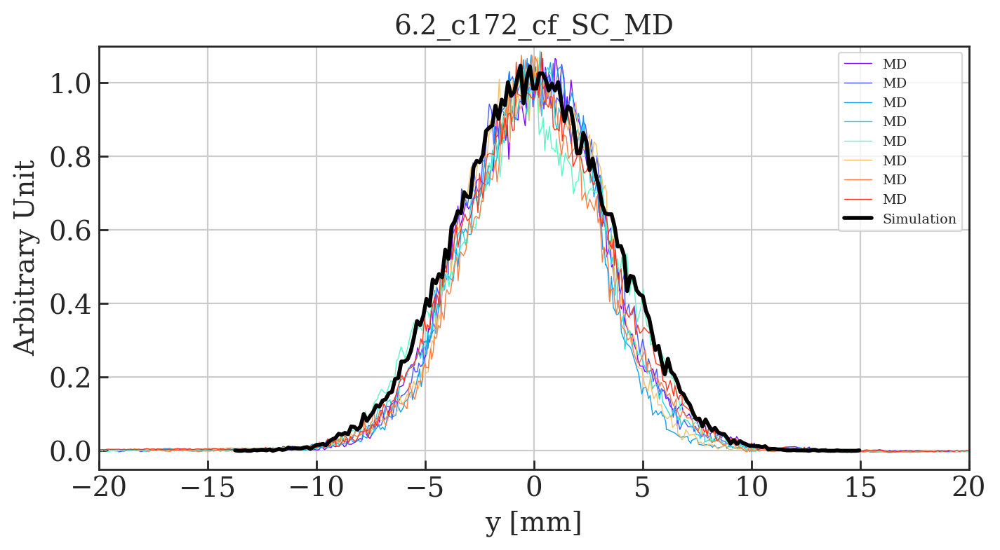

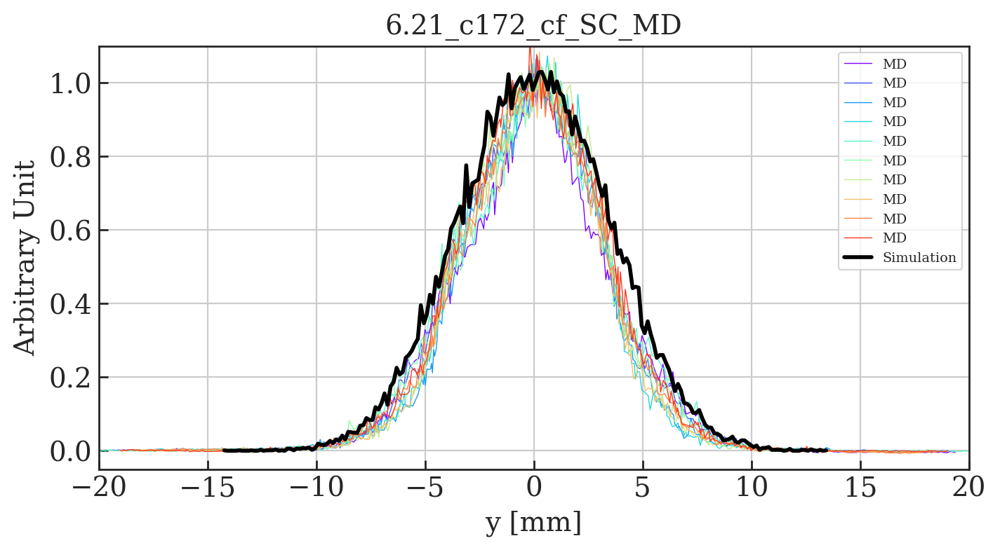

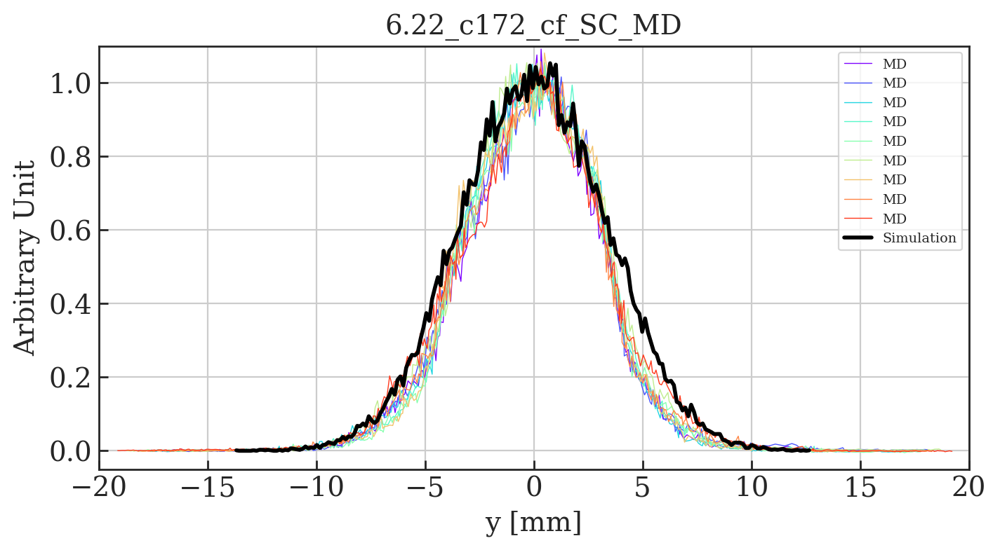

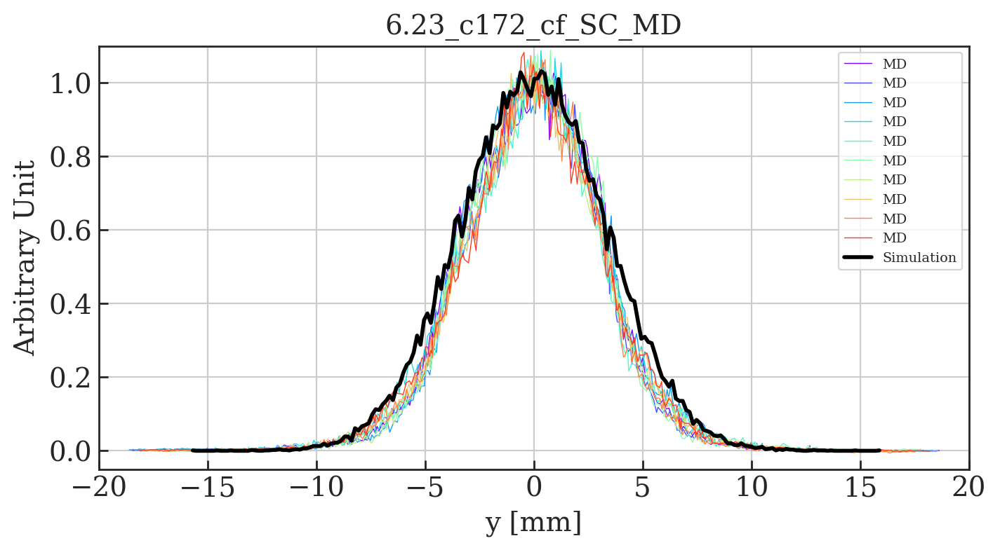

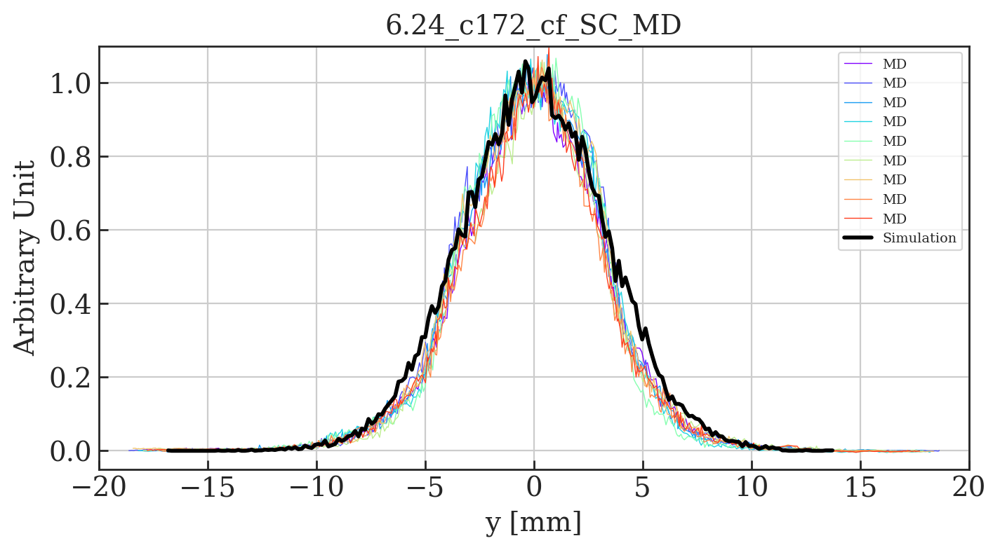

In [70]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=['Simulation']

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.64.V_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC_MD'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, particles_from_matfile(this_plot[1]), main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 1, particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, bins=200, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


# Calculate emittances for simulated bunches

Qy =  6.1 , ctime = 172.0 [ms]
Qy =  6.11 , ctime = 172.0 [ms]
Qy =  6.12 , ctime = 172.0 [ms]
Qy =  6.13 , ctime = 172.0 [ms]
Qy =  6.14 , ctime = 172.0 [ms]
Qy =  6.15 , ctime = 172.0 [ms]
Qy =  6.16 , ctime = 172.0 [ms]
Qy =  6.17 , ctime = 172.0 [ms]
Qy =  6.18 , ctime = 172.0 [ms]
Qy =  6.19 , ctime = 172.0 [ms]
Qy =  6.2 , ctime = 172.0 [ms]
Qy =  6.21 , ctime = 172.0 [ms]
Qy =  6.22 , ctime = 172.0 [ms]
Qy =  6.23 , ctime = 172.0 [ms]
Qy =  6.24 , ctime = 172.0 [ms]


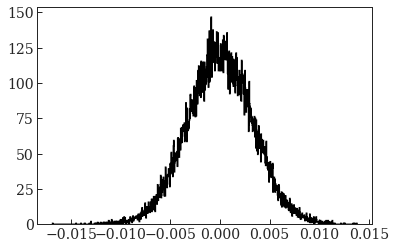

In [71]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['y'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=1.5, color='k')
          
    qx = 6.21
    qy = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.64.V_ROT:PROF_POSITION_IN', 'PR.BWS.64.V_ROT:PROF_DATA_IN'])

In [72]:
df_sim

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN
0,6.21,6.10,"[-0.017255975754858068, -0.017221769558594845,...","[0.5846893892000264, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,6.21,6.11,"[-0.017128137025125004, -0.01709479482403699, ...","[0.5998404228684916, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,6.21,6.12,"[-0.01677873392526545, -0.016745170654977097, ...","[0.5958894895572003, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,6.21,6.13,"[-0.01681532401227158, -0.016783361660995595, ...","[0.6257361927884106, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,6.21,6.14,"[-0.01708941164776376, -0.017056267137602475, ...","[0.6034181800447935, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5,6.21,6.15,"[-0.014650931481342775, -0.014619276377345064,...","[0.6318096443924418, 0.0, 0.6318096443924418, ..."
6,6.21,6.16,"[-0.014813902249301143, -0.01478366375368426, ...","[0.6614085652076424, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
7,6.21,6.17,"[-0.01542687687493883, -0.015394366384310765, ...","[0.6151860403710591, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
8,6.21,6.18,"[-0.015187874302325101, -0.015156149609220659,...","[0.6304237501733158, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
9,6.21,6.19,"[-0.01372493237492502, -0.013695390819666364, ...","[0.6770124262208097, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [73]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '64.V', smooth=True)


Multi_filter row  0

	initial guess: mu0 0.8048958721228218
	initial guess: offs0 0.0
	initial guess: ampl 69.0601695700861
	initial guess: slope 0
	initial guess: sigma0 26.725860350032843
3 parameter fit sigma =  5.693121546422402  +/-  0.020476554283689472
Removing centre shift of  -0.04470799167068834
Second moment =  5.164992233715955

Multi_filter row  1

	initial guess: mu0 -0.22364107350181586
	initial guess: offs0 0.0
	initial guess: ampl 76.08261668345047
	initial guess: slope 0
	initial guess: sigma0 26.050806794881566
3 parameter fit sigma =  5.199074915278198  +/-  0.019297077179288885
Removing centre shift of  -0.047111091681612496
Second moment =  4.725679436710911

Multi_filter row  2

	initial guess: mu0 -0.7354907274301544
	initial guess: offs0 0.0
	initial guess: ampl 86.90906326741796
	initial guess: slope 0
	initial guess: sigma0 26.22353177519295
3 parameter fit sigma =  4.76308664349141  +/-  0.015989139233575717
Removing centre shift of  -0.00466332588068877
Se

/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  6

	initial guess: mu0 0.7891614890100808
	initial guess: offs0 0.0
	initial guess: ampl 103.75295692890734
	initial guess: slope 0
	initial guess: sigma0 23.62583097030288
3 parameter fit sigma =  3.8433648824579625  +/-  0.006802094368656023
Removing centre shift of  -0.00034124556799524145
Second moment =  3.6920345889167447

Multi_filter row  7

	initial guess: mu0 -0.04941480786372493
	initial guess: offs0 0.0
	initial guess: ampl 106.47991521622407
	initial guess: slope 0
	initial guess: sigma0 25.400977815558814
3 parameter fit sigma =  3.7377054560749303  +/-  0.005858838168571991
Removing centre shift of  0.02297543383124681
Second moment =  3.624171141372004

Multi_filter row  8

	initial guess: mu0 -0.6579648604902403
	initial guess: offs0 0.0
	initial guess: ampl 109.90387378021231
	initial guess: slope 0
	initial guess: sigma0 24.787021363980887
3 parameter fit sigma =  3.6632140789340233  +/-  0.004903817717573842
Removing centre shift of  -0.0104045592

In [74]:
df_sim_filtered

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V
0,6.21,6.10,"[-0.017255975754858068, -0.017221769558594845,...","[0.5846893892000264, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.164992,5.693121546422402,0.020477,1027.812006204182,-0.04470799167068834,"[-17.21126776318738, -17.17706156692416, -17.1...","[0.14129993572333976, 0.1266827009933391, 0.11..."
1,6.21,6.11,"[-0.017128137025125004, -0.01709479482403699, ...","[0.5998404228684916, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.725679,5.199074915278198,0.019297,1027.5340621963317,-0.047111091681612496,"[-17.081025933443392, -17.04768373235538, -17....","[0.14496143552655216, 0.12996542495483987, 0.1..."
2,6.21,6.12,"[-0.01677873392526545, -0.016745170654977097, ...","[0.5958894895572003, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.368772,4.76308664349141,0.015989,1024.9068051224815,-0.00466332588068877,"[-16.774070599384764, -16.74050732909641, -16....","[0.15393811813561015, 0.14329723439351727, 0.1..."
3,6.21,6.13,"[-0.01681532401227158, -0.016783361660995595, ...","[0.6257361927884106, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.116537,4.444423122976195,0.012520,1022.0044889729719,0.041406190244415456,"[-16.856730202515994, -16.82476785124001, -16....","[0.15121957992386592, 0.13557617510415565, 0.1..."
4,6.21,6.14,"[-0.01708941164776376, -0.017056267137602475, ...","[0.6034181800447935, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.937424,4.197824637563895,0.010317,1018.5852216521532,-0.0020743011120190774,"[-17.087337346651744, -17.054192836490458, -17...","[0.08045575733930588, 0.08045575733930586, 0.0..."
5,6.21,6.15,"[-0.014650931481342775, -0.014619276377345064,...","[0.6318096443924418, 0.0, 0.6318096443924418, ...",3.782693,3.9761337353002557,0.008513,1014.8541243266333,-0.03450803361035158,"[-14.616423447732425, -14.584768343734712, -14...","[0.3159048221962208, 0.2888272660079733, 0.261..."
6,6.21,6.16,"[-0.014813902249301143, -0.01478366375368426, ...","[0.6614085652076424, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.692035,3.8433648824579625,0.006802,1011.8062780242411,-0.00034124556799524145,"[-14.813561003733147, -14.783322508116266, -14...","[0.1543286652151166, 0.14487997142643597, 0.13..."
7,6.21,6.17,"[-0.01542687687493883, -0.015394366384310765, ...","[0.6151860403710591, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.624171,3.7377054560749303,0.005859,1009.3048083449797,0.02297543383124681,"[-15.449852308770078, -15.417341818142011, -15...","[0.14866995975633931, 0.13329030874706282, 0.1..."
8,6.21,6.18,"[-0.015187874302325101, -0.015156149609220659,...","[0.6304237501733158, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.572555,3.6632140789340233,0.004904,1007.3239689762363,-0.01040455920048761,"[-15.177469743124613, -15.145745050020171, -15...","[0.20488771880632764, 0.193630151838947, 0.182..."
9,6.21,6.19,"[-0.01372493237492502, -0.013695390819666364, ...","[0.6770124262208097, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.534367,3.6033292740208154,0.003559,1005.4526070979948,-0.03532061816978127,"[-13.68961175675524, -13.660070201496584, -13....","[0.16361133633669575, 0.1466860256811755, 0.12..."


# Calculate Emittance for simulated bunches

In [75]:
# Calculate emittances in Vertical
df_sim_emittance = emittance_df(df_sim_filtered, WS='64.V', verbose=True)

Emittance  0  =  3.098168231920434
Emittance  1  =  2.622808847577603
Emittance  2  =  2.227800363681052
Emittance  3  =  1.9584082338981672
Emittance  4  =  1.7607896667804563
Emittance  5  =  1.5898128982612376
Emittance  6  =  1.4931904519600157
Emittance  7  =  1.418298539487953
Emittance  8  =  1.3671587845239632
Emittance  9  =  1.3266871109138578
Emittance  10  =  1.2839601032281764
Emittance  11  =  1.2579808362778857
Emittance  12  =  1.1906287368377053
Emittance  13  =  1.1619940186709055
Emittance  14  =  1.1323120001545932


In [76]:
df_sim_emittance

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,dy
0,6.21,6.10,"[-0.017255975754858068, -0.017221769558594845,...","[0.5846893892000264, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.164992,5.693121546422402,0.020477,1027.812006204182,-0.04470799167068834,"[-17.21126776318738, -17.17706156692416, -17.1...","[0.14129993572333976, 0.1266827009933391, 0.11...",3.098168,12.391799,23.637581,NaN,NaN
1,6.21,6.11,"[-0.017128137025125004, -0.01709479482403699, ...","[0.5998404228684916, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.725679,5.199074915278198,0.019297,1027.5340621963317,-0.047111091681612496,"[-17.081025933443392, -17.04768373235538, -17....","[0.14496143552655216, 0.12996542495483987, 0.1...",2.622809,12.404327,23.285878,NaN,NaN
2,6.21,6.12,"[-0.01677873392526545, -0.016745170654977097, ...","[0.5958894895572003, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.368772,4.76308664349141,0.015989,1024.9068051224815,-0.00466332588068877,"[-16.774070599384764, -16.74050732909641, -16....","[0.15393811813561015, 0.14329723439351727, 0.1...",2.227800,12.416825,23.009533,NaN,NaN
3,6.21,6.13,"[-0.01681532401227158, -0.016783361660995595, ...","[0.6257361927884106, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.116537,4.444423122976195,0.012520,1022.0044889729719,0.041406190244415456,"[-16.856730202515994, -16.82476785124001, -16....","[0.15121957992386592, 0.13557617510415565, 0.1...",1.958408,12.429283,22.789494,NaN,NaN
4,6.21,6.14,"[-0.01708941164776376, -0.017056267137602475, ...","[0.6034181800447935, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.937424,4.197824637563895,0.010317,1018.5852216521532,-0.0020743011120190774,"[-17.087337346651744, -17.054192836490458, -17...","[0.08045575733930588, 0.08045575733930586, 0.0...",1.760790,12.441691,22.612481,NaN,NaN
5,6.21,6.15,"[-0.014650931481342775, -0.014619276377345064,...","[0.6318096443924418, 0.0, 0.6318096443924418, ...",3.782693,3.9761337353002557,0.008513,1014.8541243266333,-0.03450803361035158,"[-14.616423447732425, -14.584768343734712, -14...","[0.3159048221962208, 0.2888272660079733, 0.261...",1.589813,12.454044,22.468965,NaN,NaN
6,6.21,6.16,"[-0.014813902249301143, -0.01478366375368426, ...","[0.6614085652076424, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.692035,3.8433648824579625,0.006802,1011.8062780242411,-0.00034124556799524145,"[-14.813561003733147, -14.783322508116266, -14...","[0.1543286652151166, 0.14487997142643597, 0.13...",1.493190,12.466338,22.351936,NaN,NaN
7,6.21,6.17,"[-0.01542687687493883, -0.015394366384310765, ...","[0.6151860403710591, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.624171,3.7377054560749303,0.005859,1009.3048083449797,0.02297543383124681,"[-15.449852308770078, -15.417341818142011, -15...","[0.14866995975633931, 0.13329030874706282, 0.1...",1.418299,12.478571,22.256128,NaN,NaN
8,6.21,6.18,"[-0.015187874302325101, -0.015156149609220659,...","[0.6304237501733158, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.572555,3.6632140789340233,0.004904,1007.3239689762363,-0.01040455920048761,"[-15.177469743124613, -15.145745050020171, -15...","[0.20488771880632764, 0.193630151838947, 0.182...",1.367159,12.490741,22.177508,NaN,NaN
9,6.21,6.19,"[-0.01372493237492502, -0.013695390819666364, ...","[0.6770124262208097, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.534367,3.6033292740208154,0.003559,1005.4526070979948,-0.03532061816978127,"[-13.68961175675524, -13.660070201496584, -13....","[0.16361133633669575, 0.1466860256811755, 0.12...",1.326687,12.502846,22.112941,NaN,NaN


In [77]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='64.V', verbose=True)

Emittance from 2nd moment 0  =  2.550019081274246
Emittance from 2nd moment 1  =  2.1669206371343517
Emittance from 2nd moment 2  =  1.8742088441996476
Emittance from 2nd moment 3  =  1.6801050890565836
Emittance from 2nd moment 4  =  1.5491136492666613
Emittance from 2nd moment 5  =  1.4388856856090682
Emittance from 2nd moment 6  =  1.3779183735203884
Emittance from 2nd moment 7  =  1.3334443708284303
Emittance from 2nd moment 8  =  1.3003262144612526
Emittance from 2nd moment 9  =  1.2763915754142676
Emittance from 2nd moment 10  =  1.2397633788748645
Emittance from 2nd moment 11  =  1.2097176170620592
Emittance from 2nd moment 12  =  1.1575431607704112
Emittance from 2nd moment 13  =  1.1528925328155373
Emittance from 2nd moment 14  =  1.154459023751898


# Calculate Emittance using 2nd moment for simulated bunches

In [78]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.64.V_ROT:PROF_POSITION_IN,PR.BWS.64.V_ROT:PROF_DATA_IN,2ndMoment V,sig V,sig errV,A V,mu V,position V,profile V,emittance V,betx,bety,dx,dy,emittance V 2ndMoment
0,6.21,6.10,"[-0.017255975754858068, -0.017221769558594845,...","[0.5846893892000264, 0.0, 0.0, 0.0, 0.0, 0.0, ...",5.164992,5.693121546422402,0.020477,1027.812006204182,-0.04470799167068834,"[-17.21126776318738, -17.17706156692416, -17.1...","[0.14129993572333976, 0.1266827009933391, 0.11...",3.098168,12.391799,23.637581,NaN,NaN,2.550019
1,6.21,6.11,"[-0.017128137025125004, -0.01709479482403699, ...","[0.5998404228684916, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.725679,5.199074915278198,0.019297,1027.5340621963317,-0.047111091681612496,"[-17.081025933443392, -17.04768373235538, -17....","[0.14496143552655216, 0.12996542495483987, 0.1...",2.622809,12.404327,23.285878,NaN,NaN,2.166921
2,6.21,6.12,"[-0.01677873392526545, -0.016745170654977097, ...","[0.5958894895572003, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.368772,4.76308664349141,0.015989,1024.9068051224815,-0.00466332588068877,"[-16.774070599384764, -16.74050732909641, -16....","[0.15393811813561015, 0.14329723439351727, 0.1...",2.227800,12.416825,23.009533,NaN,NaN,1.874209
3,6.21,6.13,"[-0.01681532401227158, -0.016783361660995595, ...","[0.6257361927884106, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4.116537,4.444423122976195,0.012520,1022.0044889729719,0.041406190244415456,"[-16.856730202515994, -16.82476785124001, -16....","[0.15121957992386592, 0.13557617510415565, 0.1...",1.958408,12.429283,22.789494,NaN,NaN,1.680105
4,6.21,6.14,"[-0.01708941164776376, -0.017056267137602475, ...","[0.6034181800447935, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.937424,4.197824637563895,0.010317,1018.5852216521532,-0.0020743011120190774,"[-17.087337346651744, -17.054192836490458, -17...","[0.08045575733930588, 0.08045575733930586, 0.0...",1.760790,12.441691,22.612481,NaN,NaN,1.549114
5,6.21,6.15,"[-0.014650931481342775, -0.014619276377345064,...","[0.6318096443924418, 0.0, 0.6318096443924418, ...",3.782693,3.9761337353002557,0.008513,1014.8541243266333,-0.03450803361035158,"[-14.616423447732425, -14.584768343734712, -14...","[0.3159048221962208, 0.2888272660079733, 0.261...",1.589813,12.454044,22.468965,NaN,NaN,1.438886
6,6.21,6.16,"[-0.014813902249301143, -0.01478366375368426, ...","[0.6614085652076424, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.692035,3.8433648824579625,0.006802,1011.8062780242411,-0.00034124556799524145,"[-14.813561003733147, -14.783322508116266, -14...","[0.1543286652151166, 0.14487997142643597, 0.13...",1.493190,12.466338,22.351936,NaN,NaN,1.377918
7,6.21,6.17,"[-0.01542687687493883, -0.015394366384310765, ...","[0.6151860403710591, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.624171,3.7377054560749303,0.005859,1009.3048083449797,0.02297543383124681,"[-15.449852308770078, -15.417341818142011, -15...","[0.14866995975633931, 0.13329030874706282, 0.1...",1.418299,12.478571,22.256128,NaN,NaN,1.333444
8,6.21,6.18,"[-0.015187874302325101, -0.015156149609220659,...","[0.6304237501733158, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.572555,3.6632140789340233,0.004904,1007.3239689762363,-0.01040455920048761,"[-15.177469743124613, -15.145745050020171, -15...","[0.20488771880632764, 0.193630151838947, 0.182...",1.367159,12.490741,22.177508,NaN,NaN,1.300326
9,6.21,6.19,"[-0.01372493237492502, -0.013695390819666364, ...","[0.6770124262208097, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.534367,3.6033292740208154,0.003559,1005.4526070979948,-0.03532061816978127,"[-13.68961175675524, -13.660070201496584, -13....","[0.16361133633669575, 0.1466860256811755, 0.12...",1.326687,12.502846,22.112941,NaN,NaN,1.276392


# Save simulation dataframe to pickle file

In [79]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

In [80]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete_simulation_data')

# Plots

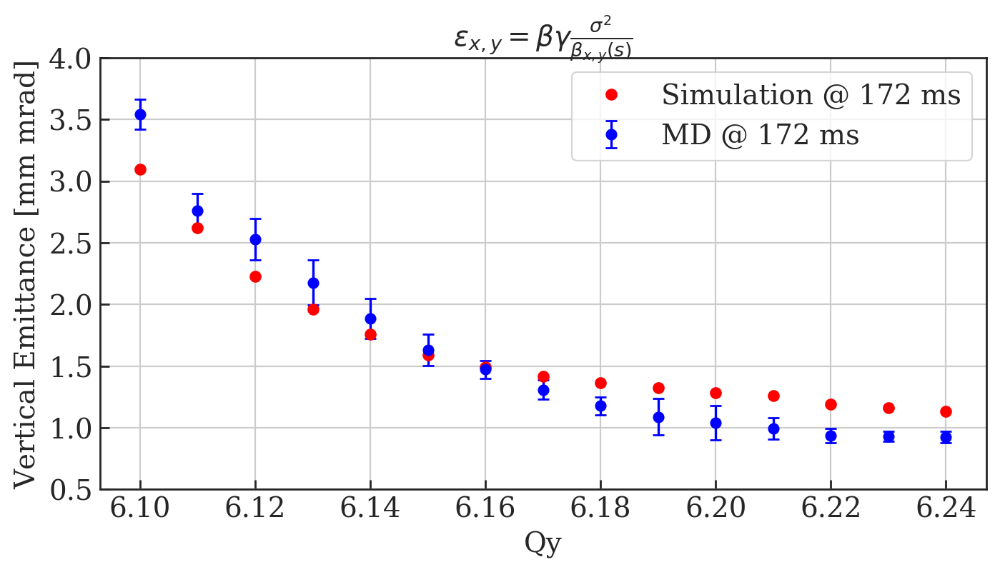

In [90]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4);

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

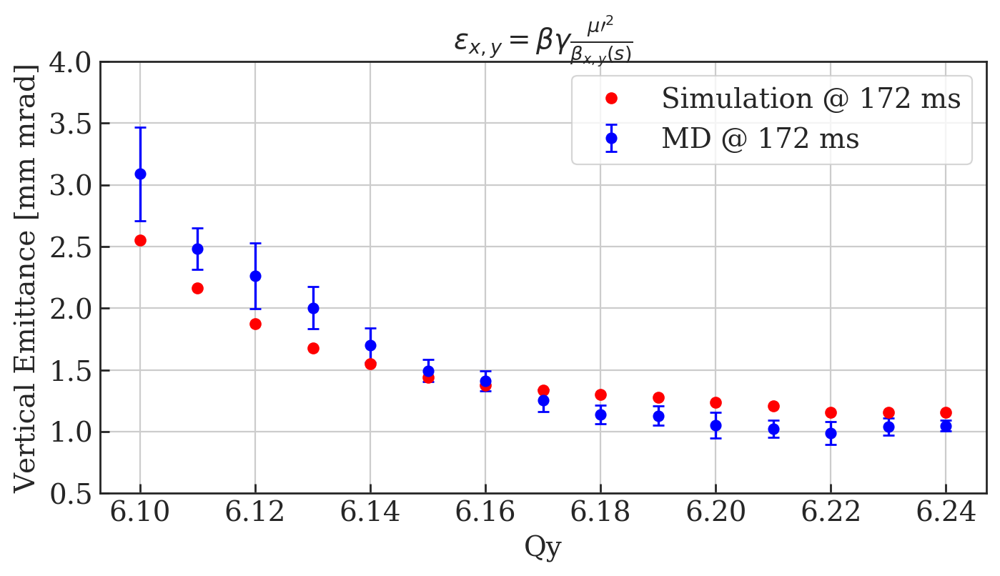

In [91]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.ylim(0.5, 4);

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');

# Core Fit

In [ ]:
df0

In [ ]:
df0_sim

# Test some stuff

In [ ]:
# Check cutting of data
x_data = df0['position V'].iloc()[0]
y_data = df0['profile V'].iloc()[0]

In [ ]:
len(x_data)

In [ ]:
len(y_data)

In [ ]:
plt.plot(x_data, y_data)

In [ ]:
indx_max = np.argmax(y_data)
indx_max

In [ ]:
quart_len_x_dat = int(len(x_data)/4)
quart_len_x_dat

In [ ]:
X = x_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]
Y = y_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]

In [ ]:
len(X)

In [ ]:
len(Y)

In [ ]:
plt.plot(X, Y)

## Current method doesn't work, have to manually find half-peak x axis index

In [ ]:
indx_max = np.argmax(y_data)
peak = y_data[indx_max]

print 'peak of ', peak, ' found at index ', indx_max

first = int(0)

for i in xrange(len(y_data)):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        first = i
        break
        
for i in reversed(xrange(len(y_data))):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        second = i
        break

X = x_data[int(first) : int(second)]
Y = y_data[int(first) : int(second)]



In [ ]:
plt.plot(X, Y)

In [ ]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


ampl = max(Y)
sigma0 = 1
mu0 = 0

popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])
print 'found sigma to be :', popt3[2]

In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

x_dat = np.linspace(-10, 10, 1000)
result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])
plt.plot(x_data, y_data, label='original data')
plt.plot(x_dat, result3, label='3 param fit');
plt.plot(X, Y, label='cut data')
plt.grid()
plt.legend()

In [ ]:
def find_factor_of_peak_indices(x_data, y_data, fac, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
            
    
    
    indices.append(first)
    indices.append(second)
    
    return indices

def find_half_peak_indices(x_data, y_data, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
    
    indices.append(first)
    indices.append(second)
    
    return indices

def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def Core_filter(ndf, with_plot = True, WS = '64.V', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'position V'
    profile_label = 'profile V'
    window = 40
    
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nCore_filter row ', j    
    
        y_data = df[profile_label].iloc()[j]
        x_data = df[position_label].iloc()[j]
        indx_max = np.argmax(y_data)  
        peak = y_data[indx_max]
        
#         print '\nPeak magnitude ', peak, 'found at index ', indx_max
        
        quart_len_x_dat = int(len(x_data)/4)
        
#         print '\nUsing indices', int(indx_max-quart_len_x_dat), ' to ', int(indx_max+quart_len_x_dat)
        
        # Use only half of the data, around the peak        
#         half_peak_indices = find_half_peak_indices(x_data, y_data)
        # equivalent
        half_peak_indices = find_factor_of_peak_indices(x_data, y_data, 0.5, verbose=True)
        
        X = x_data[half_peak_indices[0] : half_peak_indices[1]]
#         X = X/1000
        Y = y_data[half_peak_indices[0] : half_peak_indices[1]]
        
        indx_max = np.argmax(Y)        
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
#         x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
#         x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
#         FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 1
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
    
        popt3 = []
        pcov3 = []   
        
        try:
            popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])   
            
            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                x_dat = np.linspace(-20, 20, 1000)
                result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])

                plt.plot(df[position_label].iloc()[j], df[profile_label].iloc()[j], label='filtered data');
                plt.plot(X, Y, label='raw core data');
                plt.plot(x_dat, result3, label='3 param core fit' );

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Corefit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();            
            
        except:            
            
            print '3 parameter fit not found'
                        
            result3 = 'NaN'

            fit_A_3 = 'NaN'
            fit_mean_3 = 'NaN'
            fit_sigma_3 = 'NaN'

            A_3.append('NaN')
            mu_3.append('NaN')
            sigma_3.append('NaN')
            sig_err_3.append('NaN')   
        
        second_mom = second_moment(X, Y)

        mom_2nd.append(second_mom)
    
    df['Core 2ndMoment '+WS[-1]] = mom_2nd   
    
    df['Core sig '+WS[-1]] = sigma_3
    df['Core sig err'+WS[-1]] = sig_err_3
    df['Core A '+WS[-1]] = A_3
    df['Core mu '+WS[-1]] = mu_3
    
    return df

In [ ]:
df0_core = Core_filter(df0)

In [ ]:
df0_core

In [ ]:
df0_sim_core = Core_filter(df0_sim)

In [ ]:
df0_sim_core

# Emittance from Core sigma and second moment

In [ ]:
# from scipy.interpolate import interp1d
# def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
#     ptc_optics = dict()
#     #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
#     ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
#     ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
#     ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
#     ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
#     ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
#     ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
#     ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
#     ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
#     # interpolated data
    
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
# #     alpha_x_int = interp1d(Qy, alpha_x)
# #     alpha_y_int = interp1d(Qy, alpha_y)

# #     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
# #     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

# #     beta_x_int = interp1d(Qy, beta_x)
# #     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     D_x_int = interp1d(Qy, D_x)
# #     D_y_int = interp1d(Qy, D_y)

#     if tuney < 1:
#         tuney = 6 + tuney
    
#     if tuney > 6.24:
#         result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
#     elif tuney < 6.10:
#         result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
#     else:
#         result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
#     return result

# def profiles(ndf,WS='64.V',myFiles=None, lim=40):
#     df=ndf.copy()
#     # play with these limits
#     #x=np.linspace(-40,40,1000)
#     x=np.linspace(-lim,lim,1000)
#     a=df.columns
#     if 'profile '+WS[-1] not in a:
#         df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
#         df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
#     if 'sig '+WS[-1] not in a:
#         df['sig '+WS[-1]]=np.nan
#         df['mu '+WS[-1]]=np.nan
#         df['c '+WS[-1]]=np.nan
#         df['A '+WS[-1]]=np.nan

#     span=span_range(df,myFiles=myFiles)
#     if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
#         for i in span:
#             df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
#             try:
#                 yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
#                 if np.isnan(yz[0]):
#                     yz=np.nan
#             except:
#                 yz = np.nan
#             df['profile '+WS[-1]].iloc[i]=yz
#             df['position '+WS[-1]].iloc[i]=x
#     return df

# def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
#     df=ndf.copy()
#     a=df.columns
#     if 'betx' not in a:
#         df['betx']=np.nan
#     if 'bety' not in a:
#          df['bety']=np.nan
#     if 'dx' not in a:
#          df['dx']=np.nan
#     span=span_range(df,myFiles=myFiles)
#     for i in span:
#             df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
#             df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
#             df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
#     return df

def core_emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'Core emittance V' not in a:
        df['Core emittance V']=np.nan
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V']=beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

# Override original due to a bug?
def core_emittance_df_2(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V 2ndMoment']=beta*gamma*(df['Core 2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [ ]:
final_md_df = core_emittance_df(df0_core)
final_md_df = core_emittance_df_2(final_md_df)

In [ ]:
final_md_df

In [ ]:
final_sim_df = core_emittance_df(df0_sim_core)
final_sim_df = core_emittance_df_2(final_sim_df)

In [ ]:
final_sim_df

In [ ]:
df0 = final_md_df
df0_sim = final_sim_df

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\sigma_{core}^2}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2_{core}}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');